# Оптимизация управления персоналом с помощью машинного обучения: прогнозирование удовлетворенности сотрудников и минимизация оттока кадров.

**Заказчик: компания "Работа с заботой"**


**Цель**


Разработка двух моделей машинного обучения для:

* Предсказания уровня удовлетворенности сотрудников работой
* Прогнозирования вероятности увольнения сотрудника из компании

**Данные**


- Тренировочные выборки

* `train_job_satisfaction_rate.csv` (для удовлетворенности)
* `train_quit.csv` (для оттока)

- Тестовые выборки

* `test_features.csv` (входные признаки)
* `test_target_job_satisfaction_rate.csv` (целевой признак для удовлетворенности)
* `test_target_quit.csv` (целевой признак для оттока)

**Описание данных**

* `id`: уникальный идентификатор сотрудника
* `dept`: отдел
* `level`: уровень должности
* `workload`: уровень загруженности
* `employment_years`: стаж работы
* `last_year_promo`: было ли повышение за год
* `last_year_violations`: были ли нарушения трудового договора за год
* `supervisor_evaluation`: оценка руководителя
* `salary`: зарплата
* `job_satisfaction_rate`: уровень удовлетворенности (от 0 до 1, целевой признак)
* `quit`: факт увольнения (целевой признак)

**Этапы исследования**


**Обзор данных**

* Анализ типов данных, наличие пропусков, выбросов
* Оценка качества данных, выявление потенциальных проблем

**Предобработка данных**

* Исправление ошибок и пропусков
* Преобразование типов данных

**Исследовательский анализ данных (EDA)**

* Анализ распределений и взаимосвязей переменных
* Выявление факторов, влияющих на удовлетворенность и увольнения

**Подготовка данных для моделирования**

* Кодирование категориальных признаков
* Масштабирование числовых данных

**Построение и оценка моделей**

* Разработка и обучение моделей для удовлетворенности и оттока
* Подбор гиперпараметров
* Оценка качества моделей на тестовой выборке

**Анализ результатов и выработка рекомендаций**

* Интерпретация результатов моделирования
* Разработка стратегий для HR-департамента по улучшению условий работы, снижению оттока, повышению удовлетворенности

**Визуализация результатов**

* Графическое представление важнейших находок и результатов

**Итоговые выводы и рекомендации**

* Формулирование ключевых выводов
* Предложение стратегий для оптимизации управления персоналом

**Ожидаемый результат**
* Две модели машинного обучения для предсказания удовлетворенности и оттока сотрудников
* Рекомендации для HR-департамента "Работа с заботой" по улучшению управления персоналом

**Важно**

* Оба исследования будут проводиться с использованием одних и тех же входных данных (`test_features.csv`), но с различными целевыми признаками
* В первом исследовании модель будет предсказывать уровень удовлетворенности, во втором - вероятность увольнения
* Результаты обоих исследований помогут компании "Работа с заботой" повысить эффективность управления персоналом, снизить отток сотрудников и улучшить условия труда

## Загрузка и первичны обзор данных

### Импорт библиотек и настройка графиков

In [1]:
# обновления используемых библиотек
!pip -q install --upgrade -q scikit-learn
!pip -q install -q phik
!pip -q install -q shap
!pip -q install matplotlib==3.3.4
!pip -q install seaborn==0.11.1
!pip -q list

zsh:1: command not found: pip
zsh:1: command not found: pip
zsh:1: command not found: pip
zsh:1: command not found: pip
zsh:1: command not found: pip
zsh:1: command not found: pip


In [2]:
import os
import warnings
import numpy as np
import pandas as pd
from scipy.stats import ttest_ind
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import shap
from lightgbm import LGBMClassifier
from sklearn.metrics import make_scorer, roc_auc_score
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.model_selection import (
    StratifiedKFold,
    RandomizedSearchCV, 
    GridSearchCV,
    KFold
)
from sklearn.ensemble import RandomForestRegressor
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import (
    OneHotEncoder,
    LabelEncoder,
    OrdinalEncoder, 
    StandardScaler, 
    MinMaxScaler,
    RobustScaler,
)
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from lightgbm import LGBMRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn.dummy import DummyClassifier, DummyRegressor
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.neighbors import KNeighborsRegressor, KNeighborsClassifier
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier
from sklearn.svm import SVC
from phik import phik_matrix
from phik.report import plot_correlation_matrix
from scipy import stats
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier



In [3]:
RANDOM_STATE = 42
TEST_SIZE = 0.25


### Используемые функции

In [4]:
def plot_distribution_kde(df, columns):
    num_cols = len(columns)
    sns.set(style="whitegrid")  # Настройка стиля графиков
    fig, axes = plt.subplots(num_cols, 2, figsize=(14, 5 * num_cols))

    if num_cols == 1:
        axes = [axes]

    for i, col in enumerate(columns):
        # Оптимальное количество корзин
        bins = optimal_bins(df[col])  # Предполагается, что эта функция определена

        # Нормализованная плотность для "quit"
        sns.kdeplot(data=df, x=col, hue="quit", common_norm=False, ax=axes[i, 0], fill=True, alpha=0.5, palette=["skyblue", "salmon"])
        axes[i, 0].legend(title='Отток клиентов', labels=["Нет", "Да"])

        # Оформление графика
        axes[i, 0].set_title(f'График плотности распределения: {col}', fontsize=14)
        axes[i, 0].set_xlabel(col, fontsize=12)
        axes[i, 0].set_ylabel('Доля', fontsize=12)
        axes[i, 0].grid(True, linestyle='--', alpha=0.7)

        # Ящик с усами с разбивкой по "quit"
        order = df["quit"].unique()
        sns.boxplot(data=df, x="quit", y=col, ax=axes[i, 1], color='lightgreen', order=order)
        axes[i, 1].set_title(f'Ящик с усами: {col}', fontsize=14)
        axes[i, 1].set_xlabel('Отток клиентов', fontsize=12)
        axes[i, 1].set_ylabel(col, fontsize=12)
        axes[i, 1].grid(True, linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.show()


In [5]:
def analyze(df, name):
    """
    Функция для анализа датафрейма
    :param df: датафрейм для анализа
    :param name: имя датафрейма
    """
    print(f"\nАнализ DataFrame: {name}\n")
    
    # 1. Общая информация о DataFrame
    print("Общая информация:")
    display(df.head())
    display(df.info())

    # 2. Описательная статистика
    print("Описательная статистика:")
    display(df.describe(include='all'))

    # 3. Анализ по каждому столбцу
    for col in df.columns:
        print('-' * 30)
        print(f"Анализ столбца: {col}")

        # 3.1 Тип данных и количество уникальных значений
        dtype = df[col].dtype
        num_unique = df[col].nunique()
        print(f"Тип данных: {dtype}, Количество уникальных значений: {num_unique}")

        # 3.2 Уникальные значения (отсортированные) - вывод только если мало уникальных значений
        if num_unique <= 20:
            unique_values = df[col].sort_values().unique()
            print(f"Уникальные значения: {unique_values}")
        elif num_unique <= 50:  # Вывод первых и последних 10 значений, если их не слишком много
            unique_values = df[col].sort_values().unique()
            print(f"Первые 10 уникальных значений: {unique_values[:10]}")
            print(f"Последние 10 уникальных значений: {unique_values[-10:]}")

        # 3.3 Количество и процент пропущенных значений (NaN, None)
        num_missing = df[col].isnull().sum()
        percent_missing = round(df[col].isnull().mean() * 100, 2)
        print(f"Количество пропущенных значений (NaN, None): {num_missing}, Процент: {percent_missing}%")

        # 3.4 Количество и процент нулевых значений - только для числовых
        if pd.api.types.is_numeric_dtype(dtype):
            num_zeros = (df[col] == 0).sum()
            percent_zeros = round(num_zeros / len(df) * 100, 2)
            print(f"Количество 0: {num_zeros}, Процент 0: {percent_zeros}%")

        # 3.5 Проверка пропусков для текстовых столбцов (пустые строки и пробелы)
        if pd.api.types.is_string_dtype(dtype):
            num_empty = (df[col] == "").sum() + (df[col] == " ").sum()
            percent_empty = round(num_empty / len(df) * 100, 2)
            print(f"Количество пустых строк и пробелов: {num_empty}, Процент: {percent_empty}%")

        print('-' * 30, "\n")

    # 4. Проверка полных дублей
    num_duplicates = df.duplicated().sum()
    percent_duplicates = round(num_duplicates / len(df) * 100, 2)
    print(f"Количество полных дублей: {num_duplicates}, Процент полных дублей: {percent_duplicates}%")


In [6]:
def interactive_boxplot(df, df_name, column_names, yaxis_title='Значение наблюдения', xaxis_title='Наименование параметров', 
                        title_x=0.5, title_y=0.95, width=700, height=500,
                        xaxis_title_font=dict(family="Arial", size=14, color="Black"),
                        yaxis_title_font=dict(family="Arial", size=14, color="Black"),
                        title_font=dict(family="Arial", size=20, color="Black"),
                        color_discrete_sequence=['#3498db', '#e74c3c', '#2ecc71', '#9b59b6']):
    # Если передано одно имя столбца, преобразуем его в список для единообразия
    if not isinstance(column_names, list):
        column_names = [column_names]
    
    # Создаем интерактивный boxplot с Plotly Express для каждого столбца на одном графике
    fig = px.box(df, y=column_names, labels={'value': 'Values'}, points="all", width=width, height=height, boxmode='overlay', color_discrete_sequence=color_discrete_sequence)
    
    # Добавляем заголовок
    title_text = f"Интерактивный Boxplot для {df_name} - {', '.join(column_names)}"
    fig.update_layout(title_text=title_text, title_x=title_x, title_y=title_y,  
                      xaxis_title=xaxis_title, yaxis_title=yaxis_title,
                      xaxis_title_font=xaxis_title_font, yaxis_title_font=yaxis_title_font,
                      title_font=title_font)
    
    fig.show()


In [7]:
# функция, для создания графиков распределений 
def optimal_bins(data):
    """Вычисляет оптимальное количество корзин для гистограммы по правилу Стерджена."""
    n = len(data)
    return int(np.ceil(np.sqrt(n)))

# Функция для построения гистограмм и ящиков с усами
def plot_distribution(df, columns):
    """
    Строит гистограммы и ящики с усами для указанных столбцов датафрейма.
    Оптимальное количество корзин вычисляется по правилу Стерджена.
    """
    num_cols = len(columns)
    sns.set(style="whitegrid")  # Настройка стиля графиков
    fig, axes = plt.subplots(num_cols, 2, figsize=(14, 5 * num_cols))
    
    if num_cols == 1:
        axes = [axes]
    
    for i, col in enumerate(columns):
        # Оптимальное количество корзин
        bins = optimal_bins(df[col])
        
        # Гистограмма
        hist_data = df[col]
        sns.histplot(hist_data, bins=bins, kde=True, ax=axes[i, 0], color='skyblue', edgecolor='black')
        
        # Добавление средних и медианных линий
        mean = hist_data.mean()
        median = hist_data.median()
        axes[i, 0].axvline(mean, color='red', linestyle='dashed', linewidth=1.5, label=f'Среднее: {mean:.2f}')
        axes[i, 0].axvline(median, color='green', linestyle='dashed', linewidth=1.5, label=f'Медиана: {median:.2f}')
        
        # Оформление графика
        axes[i, 0].set_title(f'Гистограмма распределения: {col}', fontsize=14)
        axes[i, 0].set_xlabel(col, fontsize=12)
        axes[i, 0].set_ylabel('Частота', fontsize=12)
        axes[i, 0].legend()
        axes[i, 0].grid(True, linestyle='--', alpha=0.7)
        
        # Ящик с усами
        sns.boxplot(x=hist_data, ax=axes[i, 1], color='lightgreen')
        axes[i, 1].set_title(f'Ящик с усами: {col}', fontsize=14)
        axes[i, 1].set_xlabel(col, fontsize=12)
        axes[i, 1].grid(True, linestyle='--', alpha=0.7)
    
    plt.tight_layout()
    plt.show()


In [8]:
def plot_distribution_discrete(df, columns):
    """
    Строит countplot и ящики с усами для указанных столбцов датафрейма.
    """
    num_cols = len(columns)
    sns.set(style="whitegrid")  # Настройка стиля графиков
    fig, axes = plt.subplots(num_cols, 2, figsize=(14, 5 * num_cols))
    
    if num_cols == 1:
        axes = [axes]
    
    for i, col in enumerate(columns):
        # Countplot
        sns.countplot(x=col, data=df, ax=axes[i, 0], color='skyblue', edgecolor='black')
        
        # Добавление средних и медианных линий
        mean = df[col].mean()
        median = df[col].median()
        axes[i, 0].axvline(mean, color='red', linestyle='dashed', linewidth=1.5, label=f'Среднее: {mean:.2f}')
        axes[i, 0].axvline(median, color='green', linestyle='dashed', linewidth=1.5, label=f'Медиана: {median:.2f}')
        
        # Оформление графика
        axes[i, 0].set_title(f'Countplot распределения: {col}', fontsize=14)
        axes[i, 0].set_xlabel(col, fontsize=12)
        axes[i, 0].set_ylabel('Частота', fontsize=12)
        axes[i, 0].legend()
        axes[i, 0].grid(True, linestyle='--', alpha=0.7)
        
        # Ящик с усами
        sns.boxplot(x=col, data=df, ax=axes[i, 1], color='lightgreen')
        axes[i, 1].set_title(f'Ящик с усами: {col}', fontsize=14)
        axes[i, 1].set_xlabel(col, fontsize=12)
        axes[i, 1].grid(True, linestyle='--', alpha=0.7)
    
    plt.tight_layout()
    plt.show()




In [9]:
def plot_categorical_features(df):
    """
    Строит гистограммы для категориальных признаков DataFrame.

    """

    categorical_features = df.select_dtypes(include=['object']).columns
    num_features = len(categorical_features)
   
    num_cols = 2
    num_rows = (num_features + 1) // num_cols  # Гарантируем место для всех графиков
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))
    axes = axes.flatten()

    for i, feature in enumerate(categorical_features):
        df[feature].value_counts().plot(kind='barh', ax=axes[i], color='skyblue', edgecolor='black')
        axes[i].set_title(f'Распределение {feature}', fontsize=12)  
        axes[i].set_xlabel('Частота', fontsize=10)  
        axes[i].set_ylabel('Категория', fontsize=11)  
        axes[i].tick_params(axis='y', labelsize=11)  

    # Удаляем неиспользуемые подграфики
    for j in range(num_features, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

In [10]:
def plot_categorical_features_pie(df):
    """
    Строит пайчарты для категориальных признаков DataFrame.

    """

    categorical_features = df.select_dtypes(include=['object']).columns
    num_features = len(categorical_features)
   
    num_cols = 2
    num_rows = (num_features + 1) // num_cols  # Гарантируем место для всех графиков
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))
    axes = axes.flatten()

    for i, feature in enumerate(categorical_features):
        values = df[feature].value_counts()
        axes[i].pie(values, labels=values.index, autopct='%1.1f%%', startangle=90)
        axes[i].set_title(f'Распределение {feature}', fontsize=12)  
        axes[i].axis('equal')  # Чтобы пайчарт был круглым

    # Удаляем неиспользуемые подграфики
    for j in range(num_features, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()


In [11]:
def plot_distribution_one(df, column):
    sns.set(style="whitegrid")  # Настройка стиля графиков
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    
    # Оптимальное количество корзин
    bins = optimal_bins(df[column])
    
    # Гистограмма
    hist_data = df[column]
    sns.histplot(hist_data, bins=bins, kde=True, ax=axes[0], color='skyblue', edgecolor='black')
    
    
    # Добавление средних и медианных линий
    mean = hist_data.mean()
    median = hist_data.median()
    axes[0].axvline(mean, color='red', linestyle='dashed', linewidth=1.5, label=f'Среднее: {mean:.2f}')
    axes[0].axvline(median, color='green', linestyle='dashed', linewidth=1.5, label=f'Медиана: {median:.2f}')
    
    # Оформление графика
    axes[0].set_title(f'Гистограмма распределения: {column}', fontsize=14)
    axes[0].set_xlabel(column, fontsize=12)
    axes[0].set_ylabel('Частота', fontsize=12)
    axes[0].legend()
    axes[0].grid(True, linestyle='--', alpha=0.7)
    
    # Ящик с усами
    sns.boxplot(x=hist_data, ax=axes[1], color='lightgreen')
    axes[1].set_title(f'Ящик с усами: {column}', fontsize=14)
    axes[1].set_xlabel(column, fontsize=12)
    axes[1].grid(True, linestyle='--', alpha=0.7)
    
    plt.tight_layout()
    plt.show()


In [12]:
def plot_distribution_pa(df, columns):
    num_cols = len(columns)
    sns.set(style="whitegrid")  # Настройка стиля графиков
    fig, axes = plt.subplots(num_cols, 2, figsize=(14, 5 * num_cols))

    if num_cols == 1:
        axes = [axes]

    for i, col in enumerate(columns):
        # Оптимальное количество корзин
        bins = optimal_bins(df[col])
        
        # Гистограмма с разбивкой по "quit"
        sns.histplot(data=df, x=col, hue="quit", bins=bins, kde=True, ax=axes[i, 0], color='skyblue', edgecolor='black')
        axes[i, 0].legend(title='Отток клиентов', labels=[ "Нет", "Да"])

        # Оформление графика
        axes[i, 0].set_title(f'Гистограмма распределения: {col}', fontsize=14)
        axes[i, 0].set_xlabel(col, fontsize=12)
        axes[i, 0].set_ylabel('Частота', fontsize=12)
        axes[i, 0].grid(True, linestyle='--', alpha=0.7)

        # Ящик с усами с разбивкой по "quit"
        order = df["quit"].unique()
        sns.boxplot(data=df, x="quit", y=col, ax=axes[i, 1], color='lightgreen', order=order)
        axes[i, 1].set_title(f'Ящик с усами: {col}', fontsize=14)
        axes[i, 1].set_xlabel('Отток клиентов', fontsize=12)
        axes[i, 1].set_ylabel(col, fontsize=12)
        axes[i, 1].grid(True, linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.show()

In [13]:
def plot_distribution_pa_discrete(df, columns):
    num_cols = len(columns)
    sns.set(style="whitegrid")  # Настройка стиля графиков
    fig, axes = plt.subplots(num_cols, 2, figsize=(14, 5 * num_cols))

    if num_cols == 1:
        axes = [axes]

    for i, col in enumerate(columns):
        # Countplot с разбивкой по "quit"
        sns.countplot(data=df, x=col, hue="quit", ax=axes[i, 0], color='skyblue', edgecolor='black')
        axes[i, 0].legend(title='Quit', labels=[ "No", "Yes"])

        # Оформление графика
        axes[i, 0].set_title(f'Countplot распределения: {col}', fontsize=14)
        axes[i, 0].set_xlabel(col, fontsize=12)
        axes[i, 0].set_ylabel('Частота', fontsize=12)
        axes[i, 0].grid(True, linestyle='--', alpha=0.7)

        # Ящик с усами с разбивкой по "quit"
        order = df["quit"].unique()
        sns.boxplot(data=df, x="quit", y=col, ax=axes[i, 1], color='lightgreen', order=order)
        axes[i, 1].set_title(f'Ящик с усами: {col}', fontsize=14)
        axes[i, 1].set_xlabel('Quit', fontsize=12)
        axes[i, 1].set_ylabel(col, fontsize=12)
        axes[i, 1].grid(True, linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.show()

In [14]:
def plot_categorical_features_pie_quit(df):
    """
    Рисует круговые диаграммы для всех категориальных признаков в DataFrame, 
    разделенные по значениям "quit".
    """

    # Выбираем категориальные столбцы
    categorical_cols = df.select_dtypes(include=['object']).columns
    categorical_cols = categorical_cols[categorical_cols != 'quit']
    # Цикл по категориальным столбцам
    for feature in categorical_cols:
        # Разбиваем данные по значениям "quit"
        yes_df = df[df["quit"] == "yes"]
        no_df = df[df["quit"] == "no"]

        # Группируем данные по категориям и считаем количество
        yes_counts = yes_df[feature].value_counts()
        no_counts = no_df[feature].value_counts()

        # Создаем две фигуры для диаграмм
        fig, axes = plt.subplots(1, 2, figsize=(12, 6))

        # Рисуем диаграммы
        axes[0].pie(yes_counts.values, labels=yes_counts.index, autopct='%1.1f%%', startangle=90)
        axes[0].set_title(f"{feature} для quit = 'yes'")
        axes[1].pie(no_counts.values, labels=no_counts.index, autopct='%1.1f%%', startangle=90)
        axes[1].set_title(f"{feature} для quit = 'no'")

        # Настраиваем отображение
        plt.tight_layout()
        plt.show()

In [15]:
def plot_categorical_features_quit(df, target_column='quit', colormap='tab20b'):
    """
    Строит гистограммы для категориальных признаков DataFrame, разделяя их по значениям целевого признака "quit".
    """

    categorical_features = df.select_dtypes(include=['object']).columns.drop(target_column)
    num_features = len(categorical_features)

    num_cols = 2
    num_rows = (num_features + 1) // num_cols  # Гарантируем место для всех графиков
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))
    axes = axes.flatten()

    colors = plt.cm.get_cmap(colormap, len(df[target_column].unique()))  # Получаем цвета из палитры

    for i, feature in enumerate(categorical_features):
        for j, quit_value in enumerate(df[target_column].unique()):
            df[feature][df[target_column] == quit_value].value_counts().plot(
                kind='barh', ax=axes[i], label=quit_value, alpha=0.7, color=colors(j)
            )
        
        axes[i].set_title(f'Распределение {feature} по {target_column}', fontsize=12)
        axes[i].set_xlabel('Частота', fontsize=10)
        axes[i].set_ylabel('Категория', fontsize=11)
        axes[i].tick_params(axis='y', labelsize=11)
        axes[i].legend(title=target_column)  # Добавляем легенду для значений "quit"

    # Удаляем неиспользуемые подграфики
    for j in range(num_features, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

In [16]:
# Функция для вычисления SMAPE
def smape(y_true, y_pred):
    """
    Вычисляет симметричное среднее абсолютное процентное отклонение (SMAPE).

    Args:
        y_true: Массив истинных значений.
        y_pred: Массив предсказанных значений.

    Returns:
        Значение SMAPE.
    """
    return 100 * np.mean(np.abs(y_pred - y_true) / ((np.abs(y_true) + np.abs(y_pred)) / 2))

### Загрузка данных

In [17]:
try:
    train_job = pd.read_csv('/datasets/train_job_satisfaction_rate.csv')
    test_features = pd.read_csv('/datasets/test_features.csv')
    test_target_job = pd.read_csv('/datasets/test_target_job_satisfaction_rate.csv')
    train_quit = pd.read_csv('/datasets/train_quit.csv')
    test_target_quit = pd.read_csv('/datasets/test_target_quit.csv')
except:
    train_job = pd.read_csv('https://code.s3.yandex.net/datasets/train_job_satisfaction_rate.csv')
    test_features = pd.read_csv('https://code.s3.yandex.net/datasets/test_features.csv')
    test_target_job = pd.read_csv('https://code.s3.yandex.net/datasets/test_target_job_satisfaction_rate.csv')
    train_quit = pd.read_csv('https://code.s3.yandex.net/datasets/train_quit.csv')
    test_target_quit = pd.read_csv('https://code.s3.yandex.net/datasets/test_target_quit.csv')

In [18]:
analyze(train_job, 'train_job_satisfaction_rate')


Анализ DataFrame: train_job_satisfaction_rate

Общая информация:


,id,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary,job_satisfaction_rate
0,155278,sales,junior,medium,2,no,no,1,24000,0.58
1,653870,hr,junior,high,2,no,no,5,38400,0.76
2,184592,sales,junior,low,1,no,no,2,12000,0.11
3,171431,technology,junior,low,4,no,no,2,18000,0.37
4,693419,hr,junior,medium,1,no,no,3,22800,0.20


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4000 entries, 0 to 3999
Data columns (total 10 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     4000 non-null   int64  
 1   dept                   3994 non-null   object 
 2   level                  3996 non-null   object 
 3   workload               4000 non-null   object 
 4   employment_years       4000 non-null   int64  
 5   last_year_promo        4000 non-null   object 
 6   last_year_violations   4000 non-null   object 
 7   supervisor_evaluation  4000 non-null   int64  
 8   salary                 4000 non-null   int64  
 9   job_satisfaction_rate  4000 non-null   float64
dtypes: float64(1), int64(4), object(5)
memory usage: 312.6+ KB


None

Описательная статистика:


,id,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary,job_satisfaction_rate
count,4000.000000,3994,3996,4000,4000.000000,4000,4000,4000.000000,4000.000000,4000.000000
unique,NaN,5,3,3,NaN,2,2,NaN,NaN,NaN
top,NaN,sales,junior,medium,NaN,no,no,NaN,NaN,NaN
freq,NaN,1512,1894,2066,NaN,3880,3441,NaN,NaN,NaN
mean,544957.621000,NaN,NaN,NaN,3.718500,NaN,NaN,3.476500,33926.700000,0.533995
std,257883.104622,NaN,NaN,NaN,2.542513,NaN,NaN,1.008812,14900.703838,0.225327
min,100954.000000,NaN,NaN,NaN,1.000000,NaN,NaN,1.000000,12000.000000,0.030000
25%,322836.750000,NaN,NaN,NaN,2.000000,NaN,NaN,3.000000,22800.000000,0.360000
50%,534082.500000,NaN,NaN,NaN,3.000000,NaN,NaN,4.000000,30000.000000,0.560000
75%,771446.000000,NaN,NaN,NaN,6.000000,NaN,NaN,4.000000,43200.000000,0.710000


------------------------------
Анализ столбца: id
Тип данных: int64, Количество уникальных значений: 4000
Количество пропущенных значений (NaN, None): 0, Процент: 0.0%
Количество 0: 0, Процент 0: 0.0%
------------------------------ 

------------------------------
Анализ столбца: dept
Тип данных: object, Количество уникальных значений: 5
Уникальные значения: ['hr' 'marketing' 'purchasing' 'sales' 'technology' nan]
Количество пропущенных значений (NaN, None): 6, Процент: 0.15%
Количество пустых строк и пробелов: 0, Процент: 0.0%
------------------------------ 

------------------------------
Анализ столбца: level
Тип данных: object, Количество уникальных значений: 3
Уникальные значения: ['junior' 'middle' 'sinior' nan]
Количество пропущенных значений (NaN, None): 4, Процент: 0.1%
Количество пустых строк и пробелов: 0, Процент: 0.0%
------------------------------ 

------------------------------
Анализ столбца: workload
Тип данных: object, Количество уникальных значений: 3
Уникальные зна

In [19]:
analyze(test_features, 'test_features')


Анализ DataFrame: test_features

Общая информация:


,id,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary
0,485046,marketing,junior,medium,2,no,no,5,28800
1,686555,hr,junior,medium,1,no,no,4,30000
2,467458,sales,middle,low,5,no,no,4,19200
3,418655,sales,middle,low,6,no,no,4,19200
4,789145,hr,middle,medium,5,no,no,5,40800


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 9 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   id                     2000 non-null   int64 
 1   dept                   1998 non-null   object
 2   level                  1999 non-null   object
 3   workload               2000 non-null   object
 4   employment_years       2000 non-null   int64 
 5   last_year_promo        2000 non-null   object
 6   last_year_violations   2000 non-null   object
 7   supervisor_evaluation  2000 non-null   int64 
 8   salary                 2000 non-null   int64 
dtypes: int64(4), object(5)
memory usage: 140.8+ KB


None

Описательная статистика:


,id,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary
count,2000.000000,1998,1999,2000,2000.000000,2000,2000,2000.000000,2000.000000
unique,NaN,6,3,4,NaN,2,2,NaN,NaN
top,NaN,sales,junior,medium,NaN,no,no,NaN,NaN
freq,NaN,763,974,1043,NaN,1937,1738,NaN,NaN
mean,552765.213500,NaN,NaN,NaN,3.666500,NaN,NaN,3.526500,34066.800000
std,253851.326129,NaN,NaN,NaN,2.537222,NaN,NaN,0.996892,15398.436729
min,100298.000000,NaN,NaN,NaN,1.000000,NaN,NaN,1.000000,12000.000000
25%,339052.000000,NaN,NaN,NaN,1.000000,NaN,NaN,3.000000,22800.000000
50%,550793.000000,NaN,NaN,NaN,3.000000,NaN,NaN,4.000000,30000.000000
75%,765763.750000,NaN,NaN,NaN,6.000000,NaN,NaN,4.000000,43200.000000


------------------------------
Анализ столбца: id
Тип данных: int64, Количество уникальных значений: 2000
Количество пропущенных значений (NaN, None): 0, Процент: 0.0%
Количество 0: 0, Процент 0: 0.0%
------------------------------ 

------------------------------
Анализ столбца: dept
Тип данных: object, Количество уникальных значений: 6
Уникальные значения: [' ' 'hr' 'marketing' 'purchasing' 'sales' 'technology' nan]
Количество пропущенных значений (NaN, None): 2, Процент: 0.1%
Количество пустых строк и пробелов: 1, Процент: 0.05%
------------------------------ 

------------------------------
Анализ столбца: level
Тип данных: object, Количество уникальных значений: 3
Уникальные значения: ['junior' 'middle' 'sinior' nan]
Количество пропущенных значений (NaN, None): 1, Процент: 0.05%
Количество пустых строк и пробелов: 0, Процент: 0.0%
------------------------------ 

------------------------------
Анализ столбца: workload
Тип данных: object, Количество уникальных значений: 4
Уникальны

In [20]:
analyze(test_target_job, 'test_target_job_satisfaction_rate')


Анализ DataFrame: test_target_job_satisfaction_rate

Общая информация:


,id,job_satisfaction_rate
0,130604,0.74
1,825977,0.75
2,418490,0.60
3,555320,0.72
4,826430,0.08


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 2 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     2000 non-null   int64  
 1   job_satisfaction_rate  2000 non-null   float64
dtypes: float64(1), int64(1)
memory usage: 31.4 KB


None

Описательная статистика:


,id,job_satisfaction_rate
count,2000.000000,2000.00000
mean,552765.213500,0.54878
std,253851.326129,0.22011
min,100298.000000,0.03000
25%,339052.000000,0.38000
50%,550793.000000,0.58000
75%,765763.750000,0.72000
max,999029.000000,1.00000


------------------------------
Анализ столбца: id
Тип данных: int64, Количество уникальных значений: 2000
Количество пропущенных значений (NaN, None): 0, Процент: 0.0%
Количество 0: 0, Процент 0: 0.0%
------------------------------ 

------------------------------
Анализ столбца: job_satisfaction_rate
Тип данных: float64, Количество уникальных значений: 98
Количество пропущенных значений (NaN, None): 0, Процент: 0.0%
Количество 0: 0, Процент 0: 0.0%
------------------------------ 

Количество полных дублей: 0, Процент полных дублей: 0.0%


In [21]:
analyze(train_quit, 'train_quit.csv')


Анализ DataFrame: train_quit.csv

Общая информация:


,id,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary,quit
0,723290,sales,middle,high,2,no,no,4,54000,no
1,814010,sales,junior,medium,2,no,no,4,27600,no
2,155091,purchasing,middle,medium,5,no,no,1,37200,no
3,257132,sales,junior,medium,2,no,yes,3,24000,yes
4,910140,marketing,junior,medium,2,no,no,5,25200,no


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4000 entries, 0 to 3999
Data columns (total 10 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   id                     4000 non-null   int64 
 1   dept                   4000 non-null   object
 2   level                  4000 non-null   object
 3   workload               4000 non-null   object
 4   employment_years       4000 non-null   int64 
 5   last_year_promo        4000 non-null   object
 6   last_year_violations   4000 non-null   object
 7   supervisor_evaluation  4000 non-null   int64 
 8   salary                 4000 non-null   int64 
 9   quit                   4000 non-null   object
dtypes: int64(4), object(6)
memory usage: 312.6+ KB


None

Описательная статистика:


,id,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary,quit
count,4000.000000,4000,4000,4000,4000.000000,4000,4000,4000.000000,4000.000000,4000
unique,NaN,5,3,3,NaN,2,2,NaN,NaN,2
top,NaN,sales,junior,medium,NaN,no,no,NaN,NaN,no
freq,NaN,1438,1949,2118,NaN,3887,3455,NaN,NaN,2872
mean,552099.283750,NaN,NaN,NaN,3.701500,NaN,NaN,3.474750,33805.800000,NaN
std,260158.031387,NaN,NaN,NaN,2.541852,NaN,NaN,1.004049,15152.415163,NaN
min,100222.000000,NaN,NaN,NaN,1.000000,NaN,NaN,1.000000,12000.000000,NaN
25%,327785.750000,NaN,NaN,NaN,2.000000,NaN,NaN,3.000000,22800.000000,NaN
50%,546673.000000,NaN,NaN,NaN,3.000000,NaN,NaN,4.000000,30000.000000,NaN
75%,781497.750000,NaN,NaN,NaN,6.000000,NaN,NaN,4.000000,43200.000000,NaN


------------------------------
Анализ столбца: id
Тип данных: int64, Количество уникальных значений: 4000
Количество пропущенных значений (NaN, None): 0, Процент: 0.0%
Количество 0: 0, Процент 0: 0.0%
------------------------------ 

------------------------------
Анализ столбца: dept
Тип данных: object, Количество уникальных значений: 5
Уникальные значения: ['hr' 'marketing' 'purchasing' 'sales' 'technology']
Количество пропущенных значений (NaN, None): 0, Процент: 0.0%
Количество пустых строк и пробелов: 0, Процент: 0.0%
------------------------------ 

------------------------------
Анализ столбца: level
Тип данных: object, Количество уникальных значений: 3
Уникальные значения: ['junior' 'middle' 'sinior']
Количество пропущенных значений (NaN, None): 0, Процент: 0.0%
Количество пустых строк и пробелов: 0, Процент: 0.0%
------------------------------ 

------------------------------
Анализ столбца: workload
Тип данных: object, Количество уникальных значений: 3
Уникальные значения: ['

In [22]:
analyze(test_target_quit, 'test_target_quit.csv')


Анализ DataFrame: test_target_quit.csv

Общая информация:


,id,quit
0,999029,yes
1,372846,no
2,726767,no
3,490105,no
4,416898,yes


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      2000 non-null   int64 
 1   quit    2000 non-null   object
dtypes: int64(1), object(1)
memory usage: 31.4+ KB


None

Описательная статистика:


,id,quit
count,2000.000000,2000
unique,NaN,2
top,NaN,no
freq,NaN,1436
mean,552765.213500,NaN
std,253851.326129,NaN
min,100298.000000,NaN
25%,339052.000000,NaN
50%,550793.000000,NaN
75%,765763.750000,NaN


------------------------------
Анализ столбца: id
Тип данных: int64, Количество уникальных значений: 2000
Количество пропущенных значений (NaN, None): 0, Процент: 0.0%
Количество 0: 0, Процент 0: 0.0%
------------------------------ 

------------------------------
Анализ столбца: quit
Тип данных: object, Количество уникальных значений: 2
Уникальные значения: ['no' 'yes']
Количество пропущенных значений (NaN, None): 0, Процент: 0.0%
Количество пустых строк и пробелов: 0, Процент: 0.0%
------------------------------ 

Количество полных дублей: 0, Процент полных дублей: 0.0%


### Основные выводы

- **train_job:**
 * Содержит 4000 записей с 10 признаками, включая id, отдел (dept), уровень (level), рабочая нагрузка (workload), стаж работы (employment_years), повышение в прошлом году (last_year_promo), нарушения в прошлом году (last_year_violations), оценка руководителя (supervisor_evaluation), зарплата (salary) и уровень удовлетворенности работой (job_satisfaction_rate).
 * Имеются пропуски в столбцах dept (0.15% = 6 пропусков) и level (0.1% = 4 пропуска).
 * В столбцах dept, level, workload, last_year_promo и last_year_violations присутствуют категориальные признаки, возможно, некоторые переведем в категориальную шкалу.
 * Явных дубликатов не найдено.
 * Неявных дубликатов не найдено.
 * Орфографическая ошибка в столбце 'dept' ('sinior').

- **test_features:**
 * Содержит 2000 записей с 9 признаками, аналогичными train_job_satisfaction_rate, за исключением job_satisfaction_rate.
 * Имеются пропуски в столбцах dept (0.1% = 2 пропуска), level (0.05% = 1 пропуск).
 * В столбцах dept и workload помимо nan присутствует 'пробел' среди уникальных значений.
 * Явных дубликатов не найдено.
 * Неявных дубликатов не найдено.
 * Орфографическая ошибка в столбце 'dept' ('sinior').
 
- **test_target_job:**
 * Содержит 2000 записей с 2 признаками - id и уровень удовлетворенности работой (job_satisfaction_rate).
 * Предназначен для оценки модели, обученной на train_job.
 * Явных дубликатов не найдено.
 * Неявных дубликатов не найдено.
 
- **train_quit:**
 * Содержит 4000 записей с 10 признаками, включая id, отдел (dept), уровень (level), рабочая нагрузка (workload), стаж работы (employment_years), повышение в прошлом году (last_year_promo), нарушения в прошлом году (last_year_violations), оценка руководителя (supervisor_evaluation), зарплата (salary) и увольнение сотрудника из компании (quit).
 * Явных дубликатов не найдено.
 * Неявных дубликатов не найдено.
 * Орфографическая ошибка в столбце 'dept' ('sinior').
 
- **test_target_quit:**
 * Содержит 2000 записей с 2 признаками - id и увольнение сотрудника из компании (quit).
 * Предназначен для оценки модели, обученной на train_quit.
 * Явных дубликатов не найдено.
 * Неявных дубликатов не найдено.
 
- **Нет необходимости в переименовывании столбцов, здесь все в порядке.**
-**Типы данных в порядке**


## Предобработка данных

### Проверка на наличие ошибок и аномалий

*На предыдущем этапе не было выявлено явных дубликатов. Неявных дубликатов также не выявлено, но в train_job и test_features присутствует орфографическая ошибка в столбце 'dept' ('sinior')*

In [23]:
train_job['level'].replace({'sinior': 'senior'}, inplace=True)
test_features['level'].replace({'sinior': 'senior'}, inplace=True)
train_quit['level'].replace({'sinior': 'senior'}, inplace=True)
train_job['level'].unique()

array(['junior', 'middle', 'senior', nan], dtype=object)

In [24]:
test_features['level'].unique()

array(['junior', 'middle', 'senior', nan], dtype=object)

In [25]:
train_quit['level'].unique()

array(['middle', 'junior', 'senior'], dtype=object)

*Проверим количественные столбцы на наличие аномалий*

In [26]:
dataframes = {
    'train_job': train_job,
    'test_features': test_features,
    'test_target_job': test_target_job,
    'train_quit': train_quit,
    'test_target_quit': test_target_quit
}

for name in dataframes:
    df_drop_id = dataframes[name].drop('id', axis=1)
    for column in df_drop_id.select_dtypes(include=['float', 'int']).columns:
        interactive_boxplot(dataframes[name], name, column)

**Не было найдено аномальных значений или ошибок в количественных столбцах.**

### Обработка пропущеных значений 

#### Пайплайн для замены пропущенных значений

In [27]:
# В качестве стратегии заполнения выбрано наиболее часто встречающееся значение в столбце
imputer_pipe = Pipeline(
    [
        (
            'SimpleImputer',
            SimpleImputer(missing_values=np.nan, strategy='most_frequent')
        ),
    ]
)

#### Обработка пропущеных значений в train_job

In [28]:
train_job[train_job.isnull().any(axis=1)]

,id,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary,job_satisfaction_rate
1209,631073,sales,NaN,medium,1,no,no,4,27600,0.66
1469,416327,sales,NaN,low,1,no,no,5,18000,0.73
1526,694746,NaN,junior,medium,5,no,no,4,21600,0.62
1630,814624,NaN,junior,medium,3,no,no,4,24000,0.88
1633,475114,NaN,junior,high,4,no,no,4,31200,0.63
1745,135043,sales,NaN,medium,1,no,no,3,26400,0.30
2522,998838,sales,NaN,medium,1,no,no,5,27600,0.71
2781,497243,NaN,junior,medium,1,no,no,3,26400,0.28
2975,168668,NaN,junior,low,3,no,no,4,18000,0.88
3866,641150,NaN,junior,low,3,no,yes,4,12000,0.54


- Пропуски в столбце dept: все эти сотрудники занимают должность junior и не получали повышений за последний год. 

- Пропускм в столбце level: все эти сотрудники из отдела sales (продаж). Данные сотрудник работают в компании 1 год и не получали повышений.

**Промежуточный вывод: id в строках с пропущенными значениями уникальны, совпадений нет.**

In [29]:
# Обработаем пропущенные значения при помощи пайплайна
nan_cols = ['dept', 'level', 'workload']
train_job[nan_cols] = imputer_pipe.fit_transform(train_job[nan_cols])

In [30]:
analyze(train_job, 'train_job_satisfaction_rate')


Анализ DataFrame: train_job_satisfaction_rate

Общая информация:


,id,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary,job_satisfaction_rate
0,155278,sales,junior,medium,2,no,no,1,24000,0.58
1,653870,hr,junior,high,2,no,no,5,38400,0.76
2,184592,sales,junior,low,1,no,no,2,12000,0.11
3,171431,technology,junior,low,4,no,no,2,18000,0.37
4,693419,hr,junior,medium,1,no,no,3,22800,0.20


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4000 entries, 0 to 3999
Data columns (total 10 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     4000 non-null   int64  
 1   dept                   4000 non-null   object 
 2   level                  4000 non-null   object 
 3   workload               4000 non-null   object 
 4   employment_years       4000 non-null   int64  
 5   last_year_promo        4000 non-null   object 
 6   last_year_violations   4000 non-null   object 
 7   supervisor_evaluation  4000 non-null   int64  
 8   salary                 4000 non-null   int64  
 9   job_satisfaction_rate  4000 non-null   float64
dtypes: float64(1), int64(4), object(5)
memory usage: 312.6+ KB


None

Описательная статистика:


,id,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary,job_satisfaction_rate
count,4000.000000,4000,4000,4000,4000.000000,4000,4000,4000.000000,4000.000000,4000.000000
unique,NaN,5,3,3,NaN,2,2,NaN,NaN,NaN
top,NaN,sales,junior,medium,NaN,no,no,NaN,NaN,NaN
freq,NaN,1518,1898,2066,NaN,3880,3441,NaN,NaN,NaN
mean,544957.621000,NaN,NaN,NaN,3.718500,NaN,NaN,3.476500,33926.700000,0.533995
std,257883.104622,NaN,NaN,NaN,2.542513,NaN,NaN,1.008812,14900.703838,0.225327
min,100954.000000,NaN,NaN,NaN,1.000000,NaN,NaN,1.000000,12000.000000,0.030000
25%,322836.750000,NaN,NaN,NaN,2.000000,NaN,NaN,3.000000,22800.000000,0.360000
50%,534082.500000,NaN,NaN,NaN,3.000000,NaN,NaN,4.000000,30000.000000,0.560000
75%,771446.000000,NaN,NaN,NaN,6.000000,NaN,NaN,4.000000,43200.000000,0.710000


------------------------------
Анализ столбца: id
Тип данных: int64, Количество уникальных значений: 4000
Количество пропущенных значений (NaN, None): 0, Процент: 0.0%
Количество 0: 0, Процент 0: 0.0%
------------------------------ 

------------------------------
Анализ столбца: dept
Тип данных: object, Количество уникальных значений: 5
Уникальные значения: ['hr' 'marketing' 'purchasing' 'sales' 'technology']
Количество пропущенных значений (NaN, None): 0, Процент: 0.0%
Количество пустых строк и пробелов: 0, Процент: 0.0%
------------------------------ 

------------------------------
Анализ столбца: level
Тип данных: object, Количество уникальных значений: 3
Уникальные значения: ['junior' 'middle' 'senior']
Количество пропущенных значений (NaN, None): 0, Процент: 0.0%
Количество пустых строк и пробелов: 0, Процент: 0.0%
------------------------------ 

------------------------------
Анализ столбца: workload
Тип данных: object, Количество уникальных значений: 3
Уникальные значения: ['

 #### Обработка пропущеных значений в  test_features

In [31]:
test_features[test_features.isnull().any(axis=1)]

,id,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary
191,609865,NaN,junior,medium,1,no,no,1,20400
312,471990,sales,NaN,low,1,no,no,3,12000
1196,832342,NaN,junior,medium,1,no,no,4,28800


- В столбце dept DataFrame df_test_features содержит 2 пропущенных значений. Отмечается, что все эти сотрудники занимают должность junior, имеют средний уровень загруженности, в комании работают 1 год, не получали повышений и не имели нарушений за последний год.
- Пропускм в столбце level: 1 пропущенное значение.

In [32]:
test_features.query('dept == " "')

,id,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary
1699,822186,,middle,medium,3,no,no,4,38400


In [33]:
test_features.query('workload == " "')

,id,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary
15,590867,marketing,junior,,4,no,no,4,28800


У двух сотрудников встречаются пробелы в данных. Вероятно, эти пробелы появились из-за нежелания сотрудников предоставлять информацию или ошибок при заполнении данных.

**Промежуточный вывод: id в строках с пропущенными значениями уникальны, совпадений нет.**

In [34]:
# Заменим "пустое" значение на NaN
test_features['dept'].replace({' ': np.nan}, inplace=True)
test_features['workload'].replace({' ': np.nan}, inplace=True)


In [35]:
# Обработаем пропущенные значения при помощи пайплайна 
test_features[nan_cols] = imputer_pipe.transform(test_features[nan_cols])
analyze(test_features, 'test_features')


Анализ DataFrame: test_features

Общая информация:


,id,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary
0,485046,marketing,junior,medium,2,no,no,5,28800
1,686555,hr,junior,medium,1,no,no,4,30000
2,467458,sales,middle,low,5,no,no,4,19200
3,418655,sales,middle,low,6,no,no,4,19200
4,789145,hr,middle,medium,5,no,no,5,40800


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 9 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   id                     2000 non-null   int64 
 1   dept                   2000 non-null   object
 2   level                  2000 non-null   object
 3   workload               2000 non-null   object
 4   employment_years       2000 non-null   int64 
 5   last_year_promo        2000 non-null   object
 6   last_year_violations   2000 non-null   object
 7   supervisor_evaluation  2000 non-null   int64 
 8   salary                 2000 non-null   int64 
dtypes: int64(4), object(5)
memory usage: 140.8+ KB


None

Описательная статистика:


,id,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary
count,2000.000000,2000,2000,2000,2000.000000,2000,2000,2000.000000,2000.000000
unique,NaN,5,3,3,NaN,2,2,NaN,NaN
top,NaN,sales,junior,medium,NaN,no,no,NaN,NaN
freq,NaN,766,975,1044,NaN,1937,1738,NaN,NaN
mean,552765.213500,NaN,NaN,NaN,3.666500,NaN,NaN,3.526500,34066.800000
std,253851.326129,NaN,NaN,NaN,2.537222,NaN,NaN,0.996892,15398.436729
min,100298.000000,NaN,NaN,NaN,1.000000,NaN,NaN,1.000000,12000.000000
25%,339052.000000,NaN,NaN,NaN,1.000000,NaN,NaN,3.000000,22800.000000
50%,550793.000000,NaN,NaN,NaN,3.000000,NaN,NaN,4.000000,30000.000000
75%,765763.750000,NaN,NaN,NaN,6.000000,NaN,NaN,4.000000,43200.000000


------------------------------
Анализ столбца: id
Тип данных: int64, Количество уникальных значений: 2000
Количество пропущенных значений (NaN, None): 0, Процент: 0.0%
Количество 0: 0, Процент 0: 0.0%
------------------------------ 

------------------------------
Анализ столбца: dept
Тип данных: object, Количество уникальных значений: 5
Уникальные значения: ['hr' 'marketing' 'purchasing' 'sales' 'technology']
Количество пропущенных значений (NaN, None): 0, Процент: 0.0%
Количество пустых строк и пробелов: 0, Процент: 0.0%
------------------------------ 

------------------------------
Анализ столбца: level
Тип данных: object, Количество уникальных значений: 3
Уникальные значения: ['junior' 'middle' 'senior']
Количество пропущенных значений (NaN, None): 0, Процент: 0.0%
Количество пустых строк и пробелов: 0, Процент: 0.0%
------------------------------ 

------------------------------
Анализ столбца: workload
Тип данных: object, Количество уникальных значений: 3
Уникальные значения: ['

**Все пропущенные значения в данных были успешно обработаны с помощью пайплайна imputer_pipe, который заменял пропущенные значения на наиболее часто встречающиеся.
Были исправлены орфографические ошибки и обработаны пробелы в данных.
В результате предобработки данные стали более полными и согласованными.**


## Исследовательский анализ данных

### Исследование количественных данных train_job

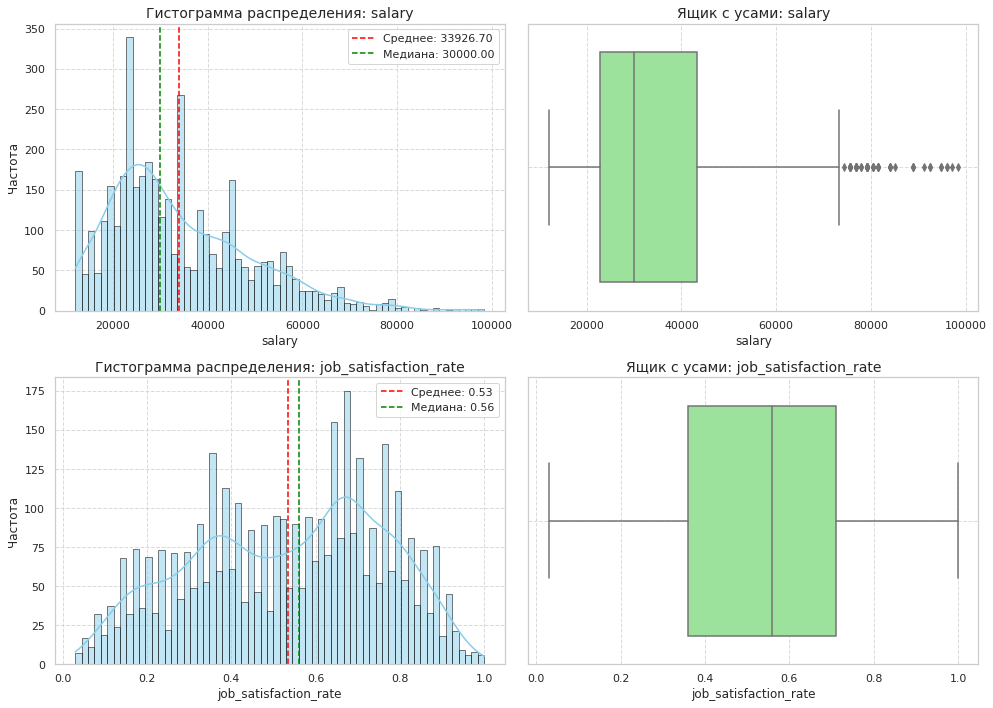

In [36]:
# Построение графиков для выбранных столбцов
columns_to_analyze = [
    'salary',
    'job_satisfaction_rate'
]


plot_distribution(train_job, columns_to_analyze)

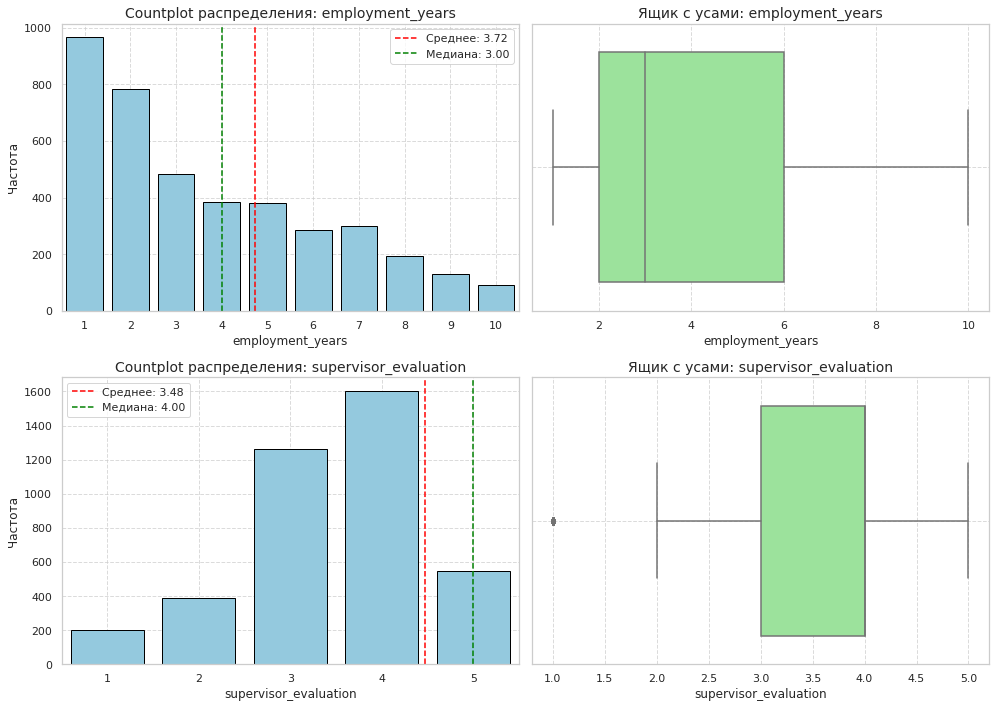

In [37]:
# Построение графиков для выбранных столбцов
columns_to_analyze_discrete = [
    'employment_years',
    'supervisor_evaluation'
]

plot_distribution_discrete(train_job, columns_to_analyze_discrete)

### Исследование категориальных данных train_job

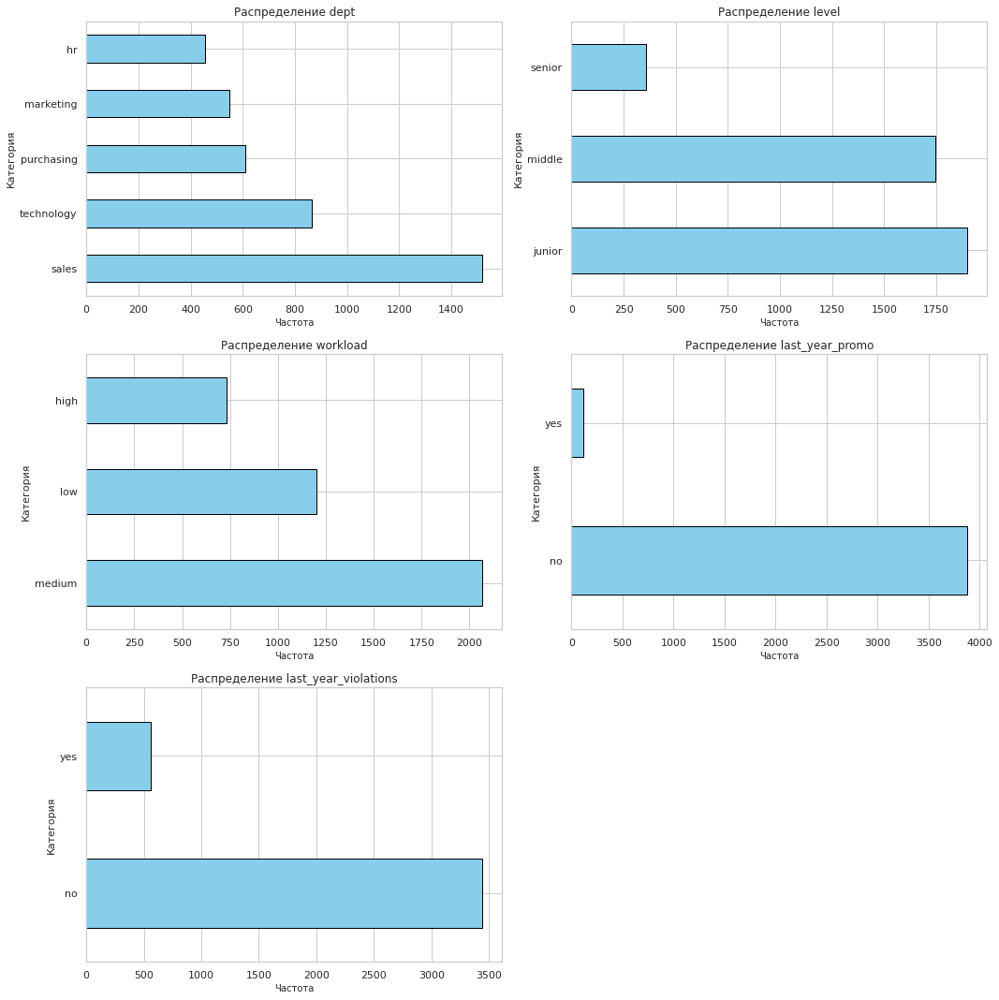

In [38]:
plot_categorical_features(train_job)

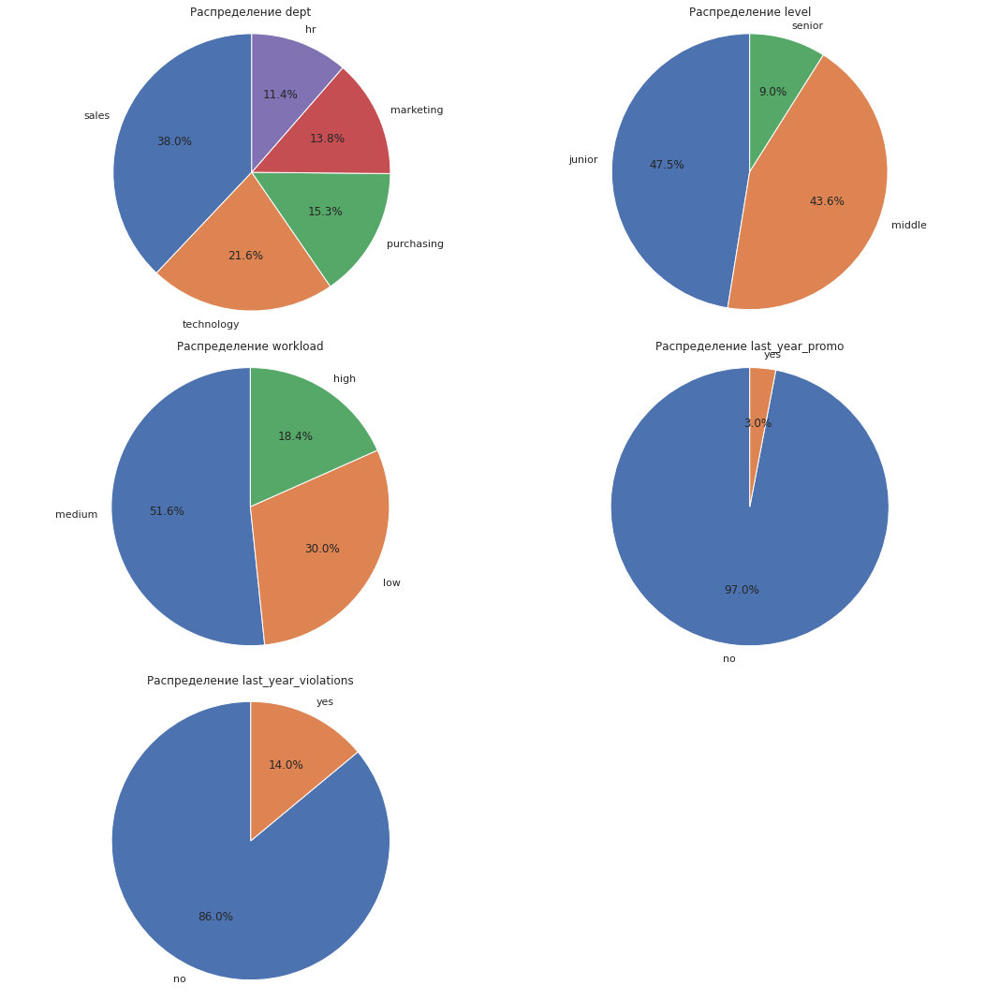

In [39]:
plot_categorical_features_pie(train_job)

### Исследование количественных данных test_features

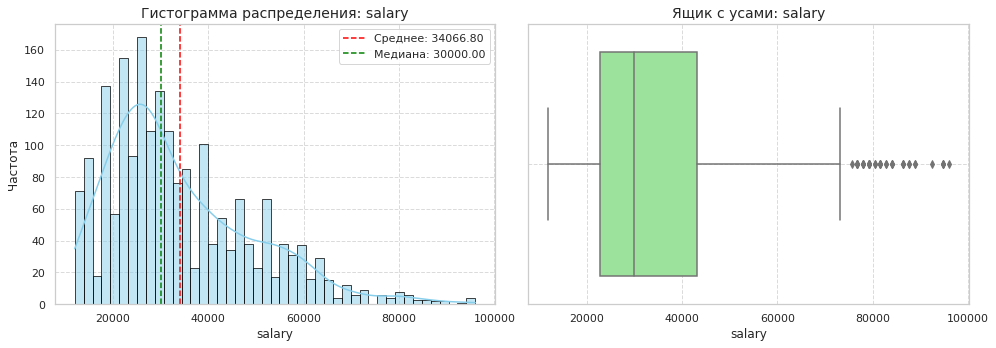

In [40]:
plot_distribution_one(test_features, 'salary')

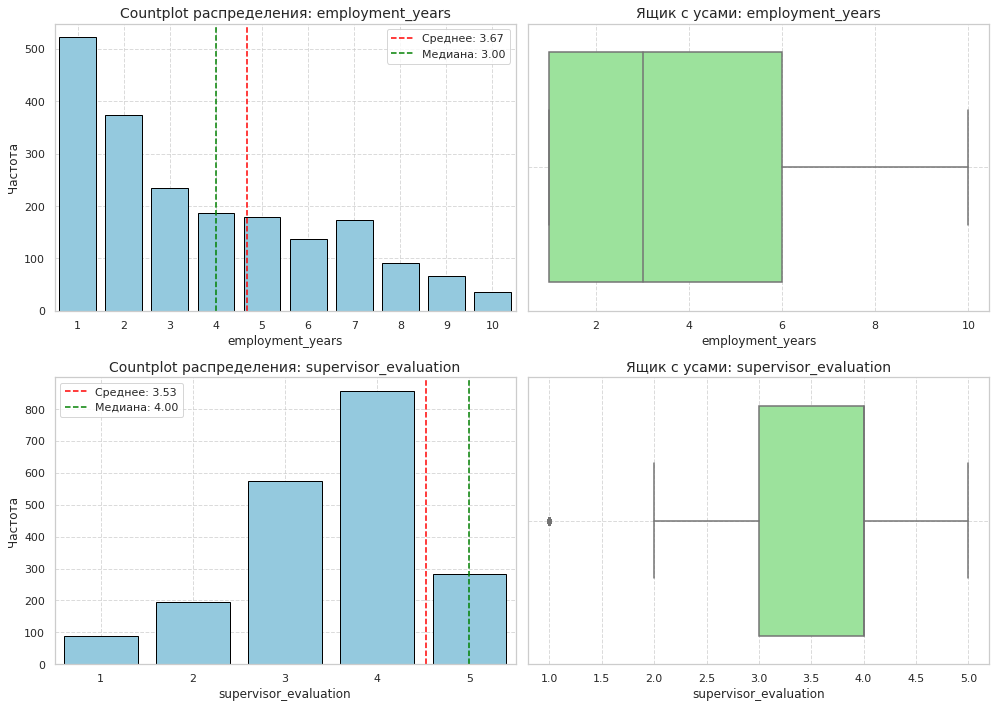

In [41]:
plot_distribution_discrete(test_features, columns_to_analyze_discrete)

### Исследование категориальных данных test_features

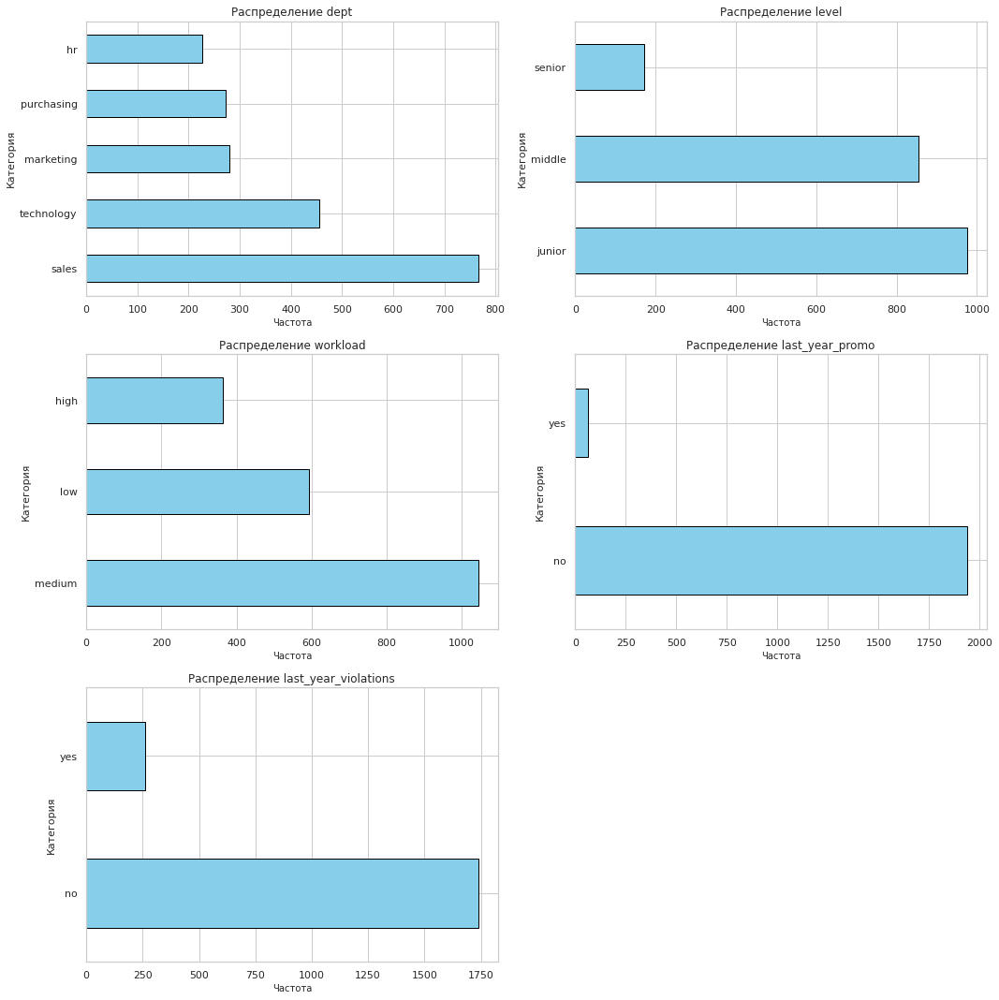

In [42]:
plot_categorical_features(test_features)

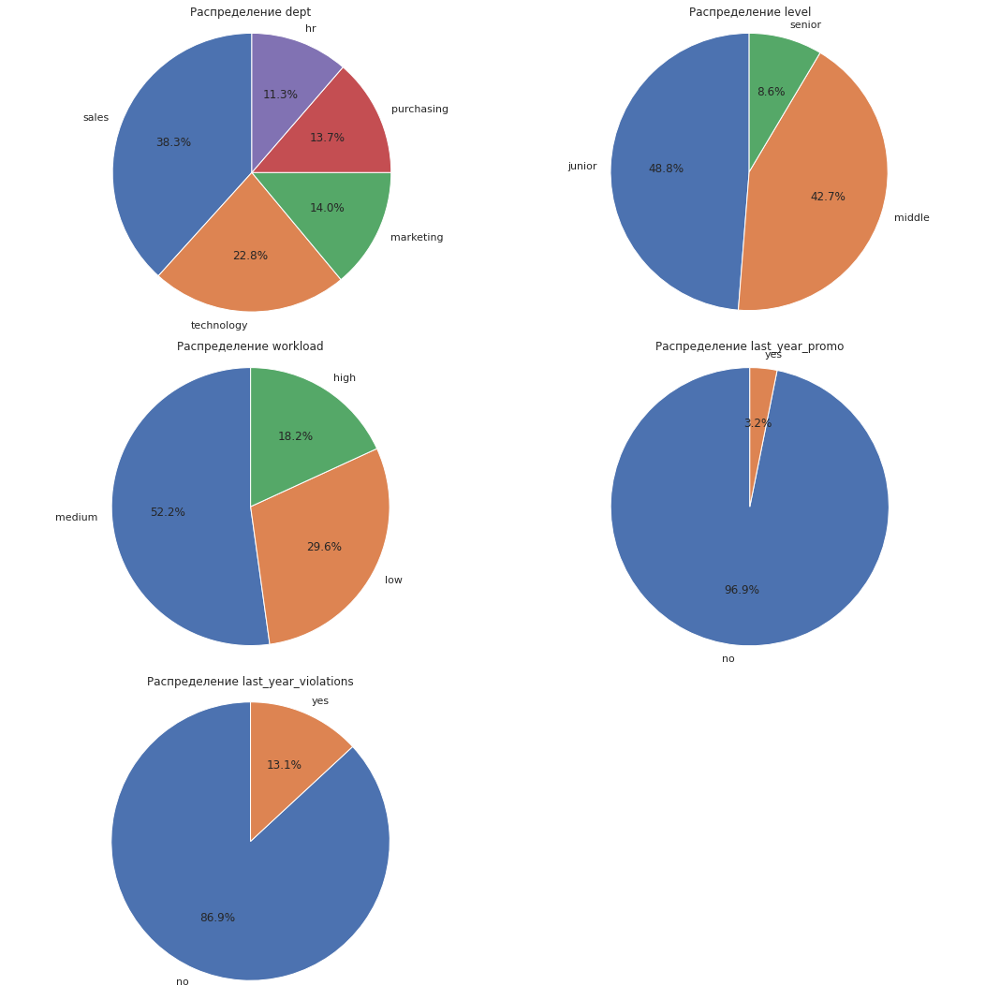

In [43]:
plot_categorical_features_pie(test_features)

### Исследование количественных данных test_target_job

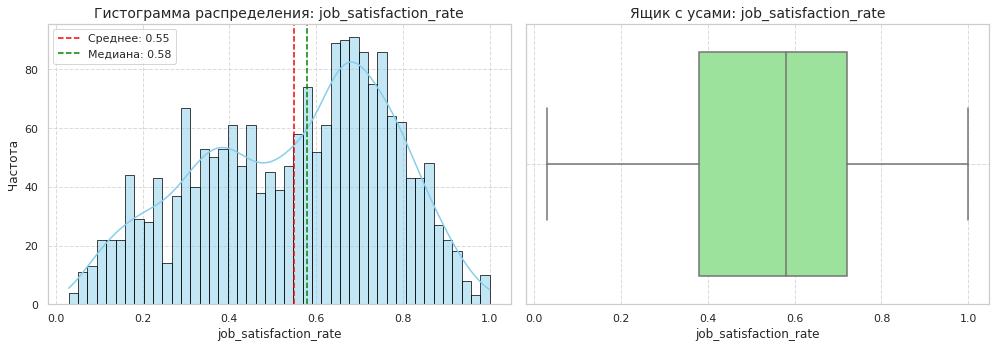

In [44]:
plot_distribution_one(test_target_job, 'job_satisfaction_rate')

### Исследование количественных данных train_quit

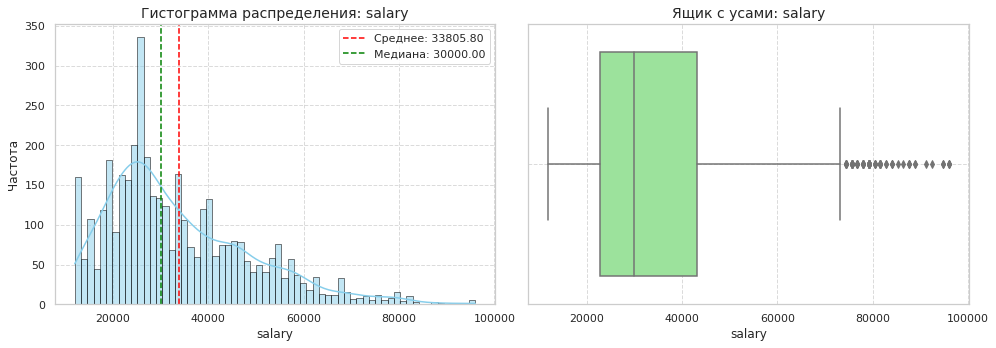

In [45]:
plot_distribution_one(train_quit, 'salary')

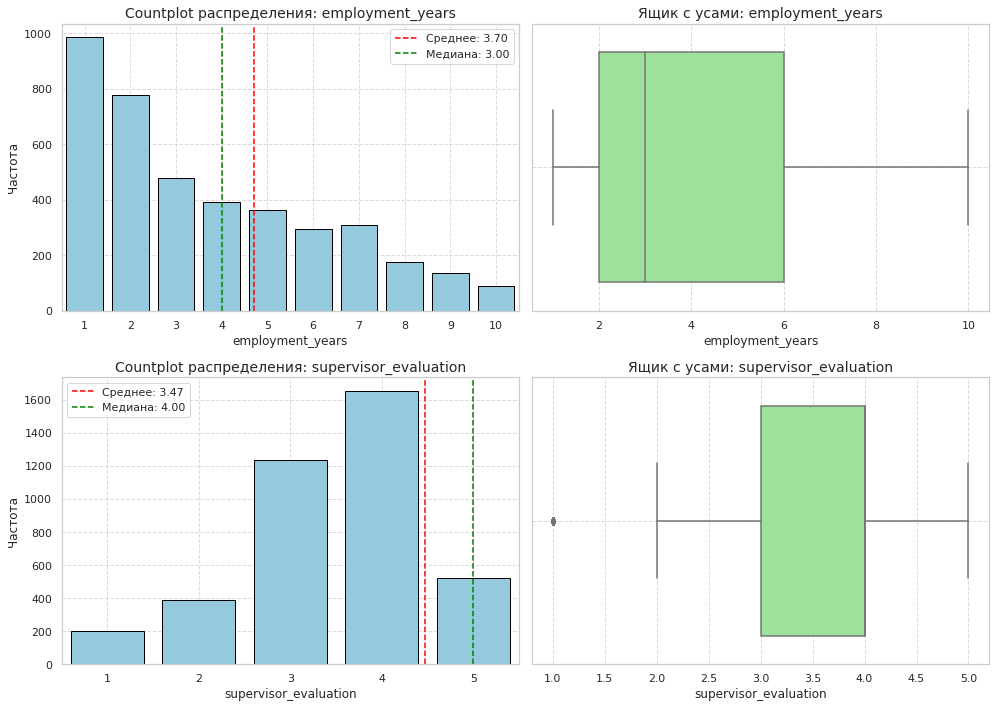

In [46]:
plot_distribution_discrete(train_quit, columns_to_analyze_discrete)

### Исследование категориальных данных train_quit

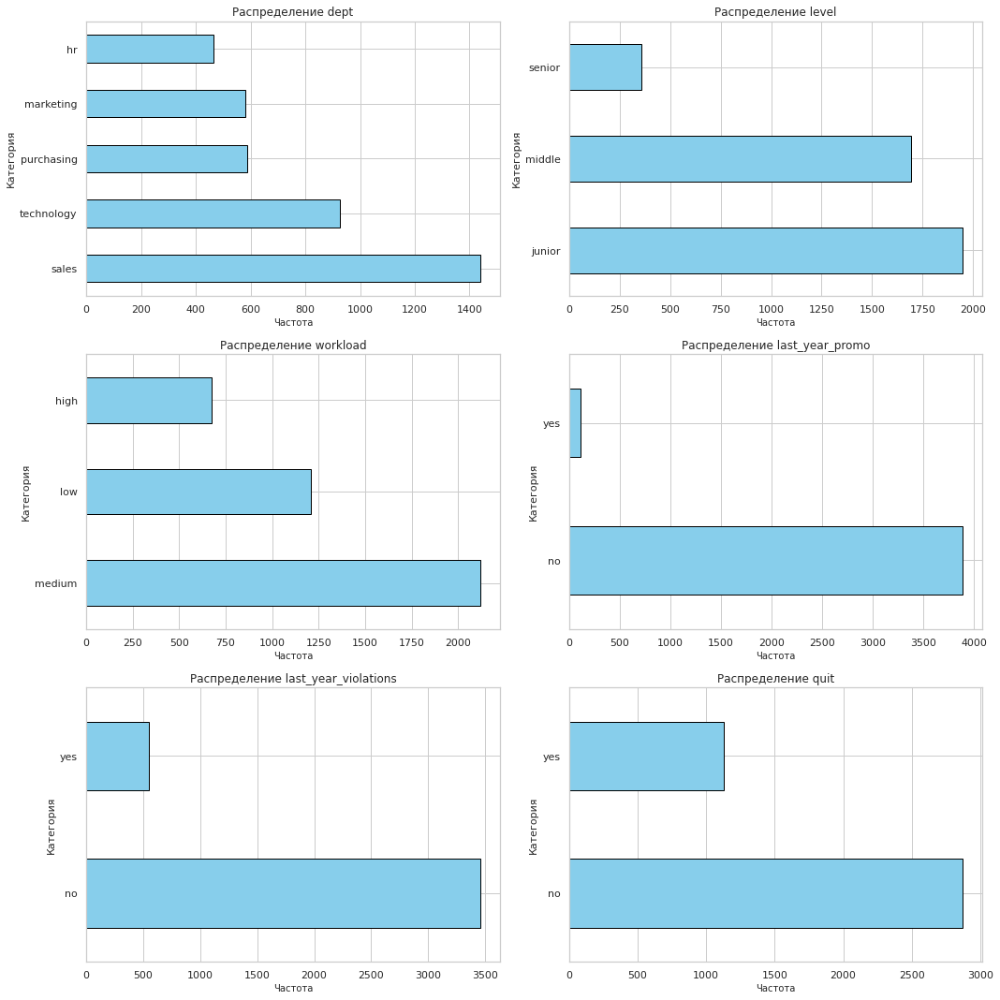

In [47]:
plot_categorical_features(train_quit)

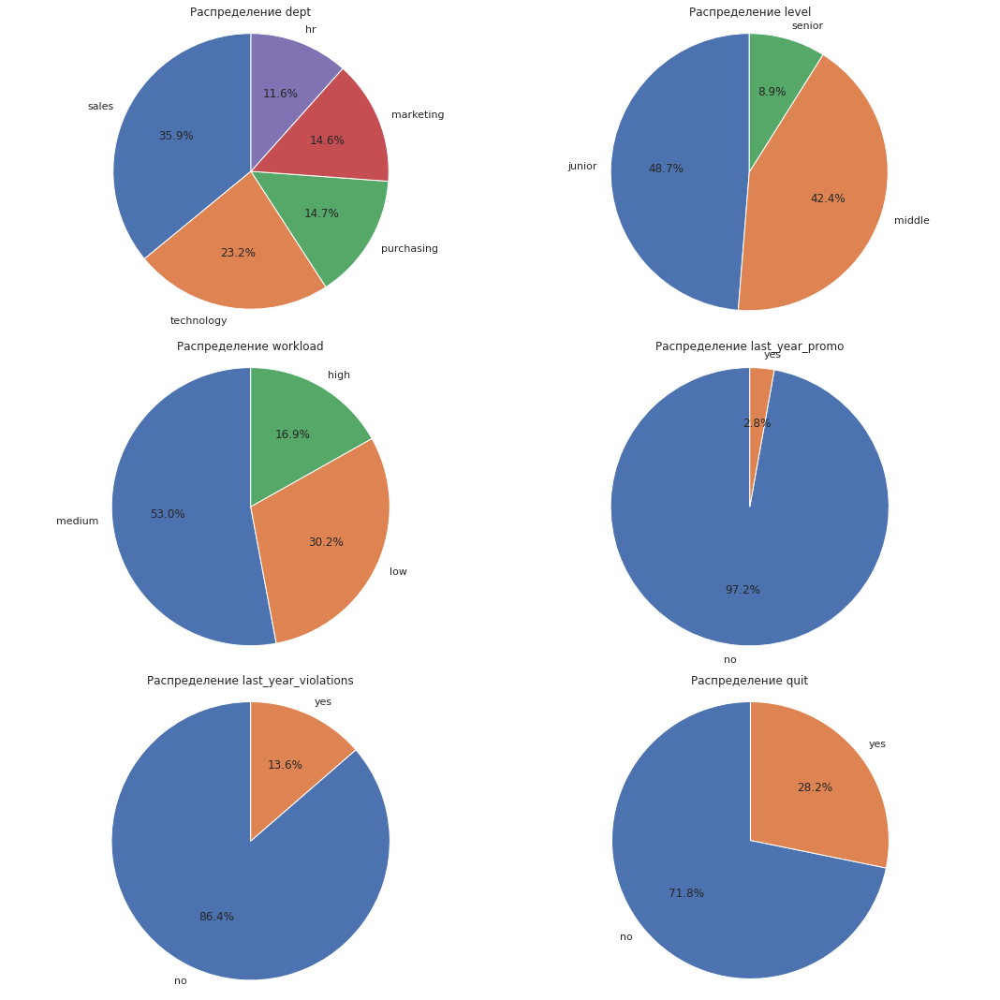

In [48]:
plot_categorical_features_pie(train_quit)

### Исследование категориальных данных test_target_quit

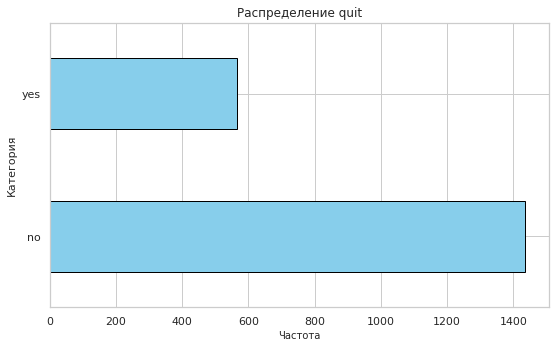

In [49]:
plot_categorical_features(test_target_quit)

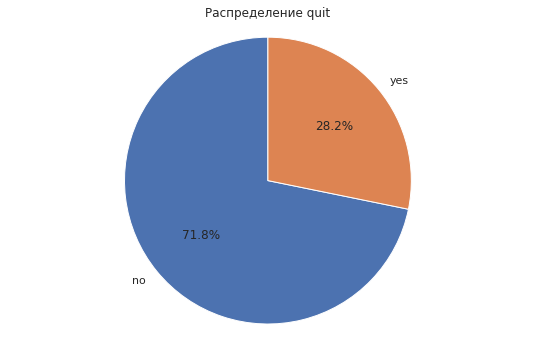

In [50]:
plot_categorical_features_pie(test_target_quit)

### Промежуточный вывод:
**Явных различий между (df_train, train_quit и test_features), (df_train и test_target_job по 'job_satisfaction_rate'), а также (train_quit и test_target_quit по 'quit') не наблюдается.**

* salary:

Средняя зарплата сотрудников составляет около 34,000 с небольшим различием между тренировочной и тестовой выборками, медианная зарплата — 30,000.
Распределение зарплат скошено вправо, что означает наличие небольшого числа сотрудников с очень высокой зарплатой и большого количества сотрудников с относительно низким доходом.

* employment_years:

Сотрудники в среднем работают в компании чуть меньше 4 лет, с большинством имеющих стаж до 6 лет, что может указывать на относительно высокую текучесть кадров или на недавние массовые наймы.
Распределение показывает, что есть значительное количество сотрудников с небольшим стажем работы, что может коррелировать с уровнем удовлетворенности и потенциальной увольняемостью.

* supervisor_evaluation:

Средняя оценка руководителя составляет около 3.5, медианное значение — 4, что может свидетельствовать о положительной тенденции в оценках со стороны руководителей. 
Распределение оценок показывает пик около значения 4, что может указывать на тенденцию руководителей оценивать сотрудников положительно (распределение скошено влево).

* job_satisfaction_rate:

Средний уровень удовлетворенности работы 0.53 в train и 0.55 в test, что указывает на среднюю степень удовлетворенности сотрудников своей работой.
Распределение этого показателя имеет два пика, один около 0.35 и другой около 0.7, что может свидетельствовать о наличии двух различных групп сотрудников с разной степенью удовлетворенности.

* dept: 

Большинство сотрудников работает в отделах продаж и технологий, в то время как отделы HR и маркетинг представлены в меньшем количестве.

* level: 

Подавляющее большинство сотрудников — это специалисты уровня "junior", за ними следуют сотрудники уровня "middle". Специалисты уровня "senior" составляют небольшую часть персонала.

* workload: 

Большая часть сотрудников имеет среднюю рабочую нагрузку.

* last_year_promo: 

Почти все сотрудники не получали повышение в прошлом году.

* last_year_violations: 

Большинство сотрудников не имеют нарушений за прошлый год.

* quit:

Примерно 3/4 сотрудников не уволились, в то время как остальная часть составила уволившихся.

Подготовка признаков:

* id: Идентификатор, не используется для обучения модели.
* dept: Категориальный признак, требует One-Hot Encoding (или другой подходящей кодировки категориальных признаков).
* level: Категориальный признак, требует One-Hot Encoding (или другой подходящей кодировки категориальных признаков).
* workload: Категориальный признак, требует One-Hot Encoding (или другой подходящей кодировки категориальных признаков).
* employment_years: Количественный признак, может быть использован напрямую.
* last_year_promo: Категориальный признак, требует Label Encoding (или другой подходящей кодировки категориальных признаков).
* last_year_violations: Категориальный признак, требует Label Encoding (или другой подходящей кодировки категориальных признаков).
* supervisor_evaluation: Количественный признак, может быть использован напрямую.
* salary: Количественный признак, может быть использован напрямую или требуют Standardization/Normalization (в зависимости от алгоритма).
* job_satisfaction_rate: Целевой признак (для модели удовлетворенности), требует Standardization/Normalization (в зависимости от алгоритма).
* quit: Целевой признак (для модели увольнения), требует Label Encoding.


### Объединение данных 

In [51]:
print("Размеры test_features:", test_features.shape)
print("Размеры test_target_job:", test_target_job.shape)
print("Размеры test_target_quit:", test_target_quit.shape)

Размеры test_features: (2000, 9)
Размеры test_target_job: (2000, 2)
Размеры test_target_quit: (2000, 2)


In [52]:
test_target_quit_merged = test_target_quit.merge(test_features, on='id', suffixes=('_quit', '_features'))
test_target_quit_merged = test_target_quit_merged.merge(test_target_job, on='id', suffixes=('', '_job'))
analyze(test_target_quit_merged, 'test_target_quit_merged')


Анализ DataFrame: test_target_quit_merged

Общая информация:


,id,quit,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary,job_satisfaction_rate
0,999029,yes,technology,junior,medium,1,no,no,3,31200,0.35
1,372846,no,sales,middle,medium,10,no,yes,2,32400,0.21
2,726767,no,marketing,middle,low,7,no,no,4,20400,0.73
3,490105,no,purchasing,middle,low,7,no,no,4,19200,0.62
4,416898,yes,purchasing,junior,low,1,no,no,4,12000,0.57


<class 'pandas.core.frame.DataFrame'>
Int64Index: 2000 entries, 0 to 1999
Data columns (total 11 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     2000 non-null   int64  
 1   quit                   2000 non-null   object 
 2   dept                   2000 non-null   object 
 3   level                  2000 non-null   object 
 4   workload               2000 non-null   object 
 5   employment_years       2000 non-null   int64  
 6   last_year_promo        2000 non-null   object 
 7   last_year_violations   2000 non-null   object 
 8   supervisor_evaluation  2000 non-null   int64  
 9   salary                 2000 non-null   int64  
 10  job_satisfaction_rate  2000 non-null   float64
dtypes: float64(1), int64(4), object(6)
memory usage: 187.5+ KB


None

Описательная статистика:


,id,quit,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary,job_satisfaction_rate
count,2000.000000,2000,2000,2000,2000,2000.000000,2000,2000,2000.000000,2000.000000,2000.00000
unique,NaN,2,5,3,3,NaN,2,2,NaN,NaN,NaN
top,NaN,no,sales,junior,medium,NaN,no,no,NaN,NaN,NaN
freq,NaN,1436,766,975,1044,NaN,1937,1738,NaN,NaN,NaN
mean,552765.213500,NaN,NaN,NaN,NaN,3.666500,NaN,NaN,3.526500,34066.800000,0.54878
std,253851.326129,NaN,NaN,NaN,NaN,2.537222,NaN,NaN,0.996892,15398.436729,0.22011
min,100298.000000,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,1.000000,12000.000000,0.03000
25%,339052.000000,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,3.000000,22800.000000,0.38000
50%,550793.000000,NaN,NaN,NaN,NaN,3.000000,NaN,NaN,4.000000,30000.000000,0.58000
75%,765763.750000,NaN,NaN,NaN,NaN,6.000000,NaN,NaN,4.000000,43200.000000,0.72000


------------------------------
Анализ столбца: id
Тип данных: int64, Количество уникальных значений: 2000
Количество пропущенных значений (NaN, None): 0, Процент: 0.0%
Количество 0: 0, Процент 0: 0.0%
------------------------------ 

------------------------------
Анализ столбца: quit
Тип данных: object, Количество уникальных значений: 2
Уникальные значения: ['no' 'yes']
Количество пропущенных значений (NaN, None): 0, Процент: 0.0%
Количество пустых строк и пробелов: 0, Процент: 0.0%
------------------------------ 

------------------------------
Анализ столбца: dept
Тип данных: object, Количество уникальных значений: 5
Уникальные значения: ['hr' 'marketing' 'purchasing' 'sales' 'technology']
Количество пропущенных значений (NaN, None): 0, Процент: 0.0%
Количество пустых строк и пробелов: 0, Процент: 0.0%
------------------------------ 

------------------------------
Анализ столбца: level
Тип данных: object, Количество уникальных значений: 3
Уникальные значения: ['junior' 'middle' 'se

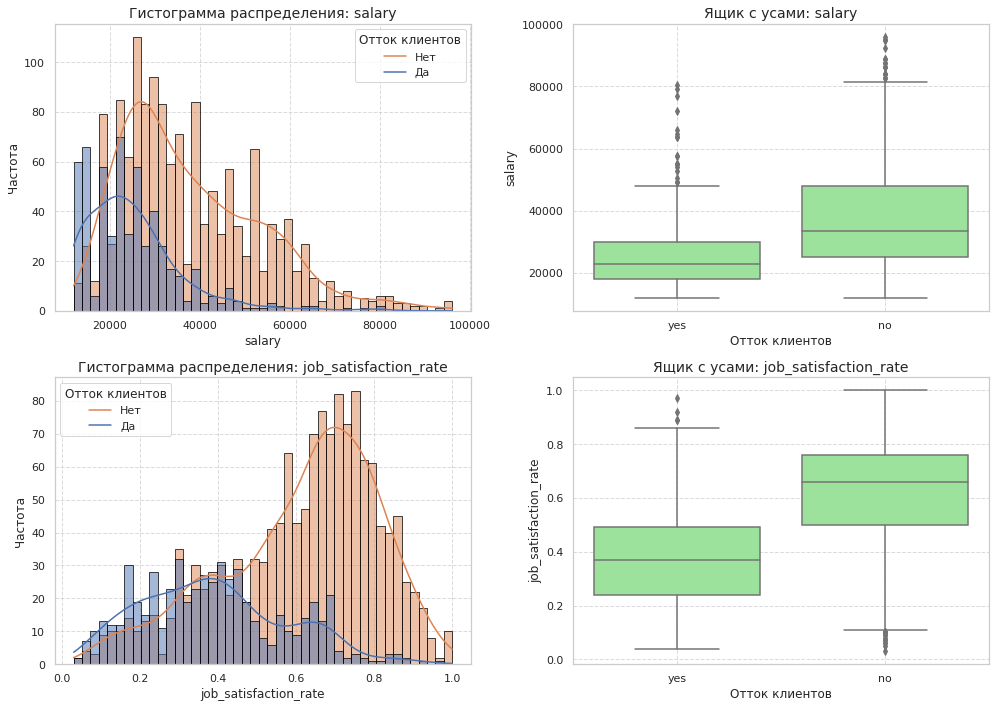

In [53]:
plot_distribution_pa(test_target_quit_merged, columns_to_analyze)

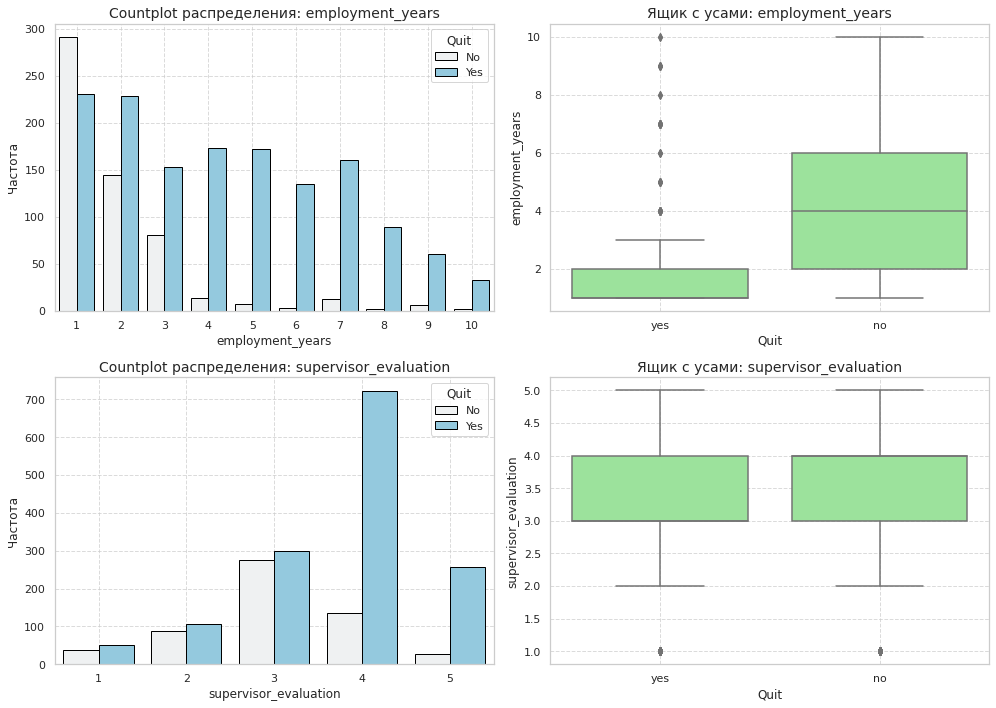

In [54]:
plot_distribution_pa_discrete(test_target_quit_merged, columns_to_analyze_discrete)

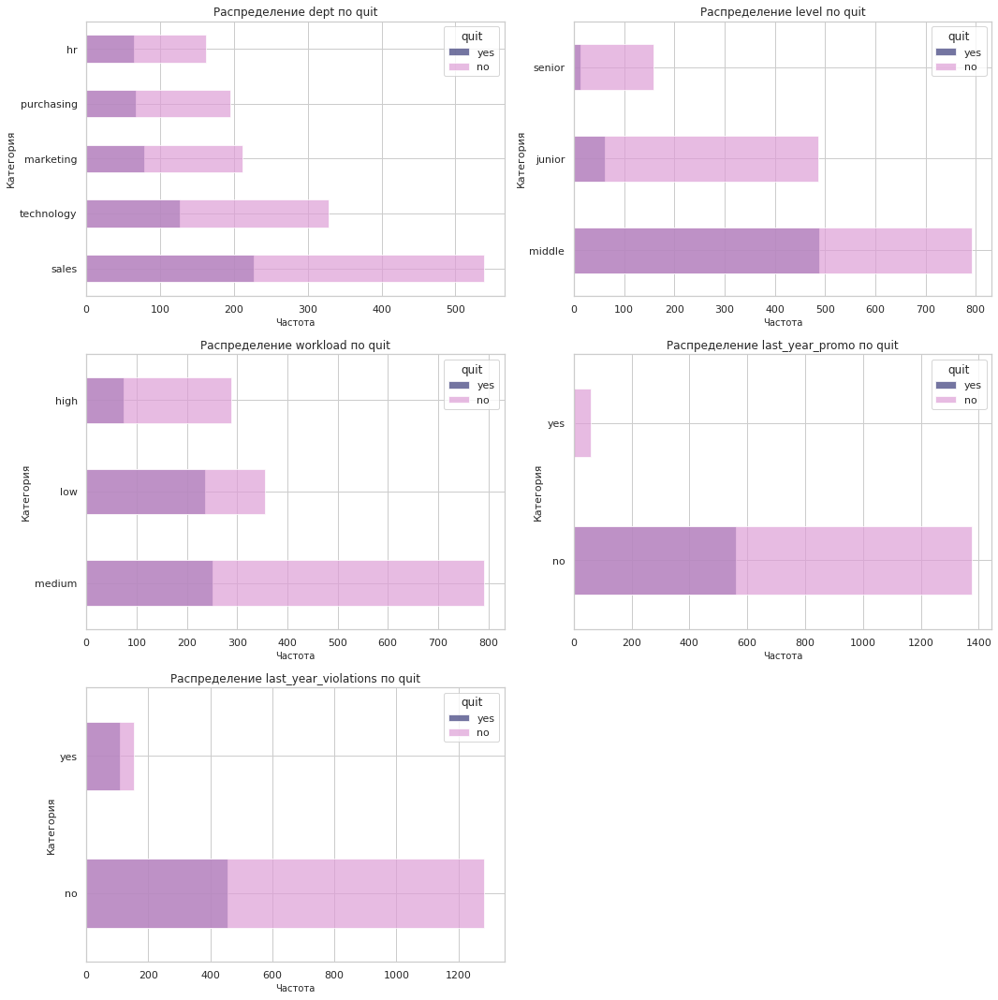

In [55]:
plot_categorical_features_quit(test_target_quit_merged)

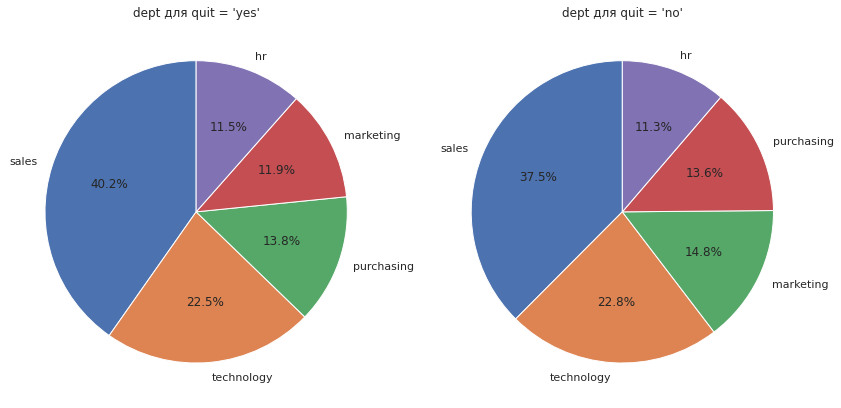

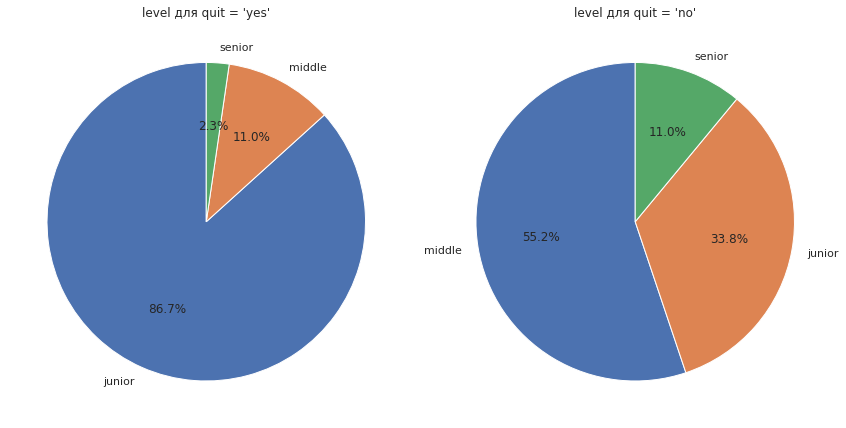

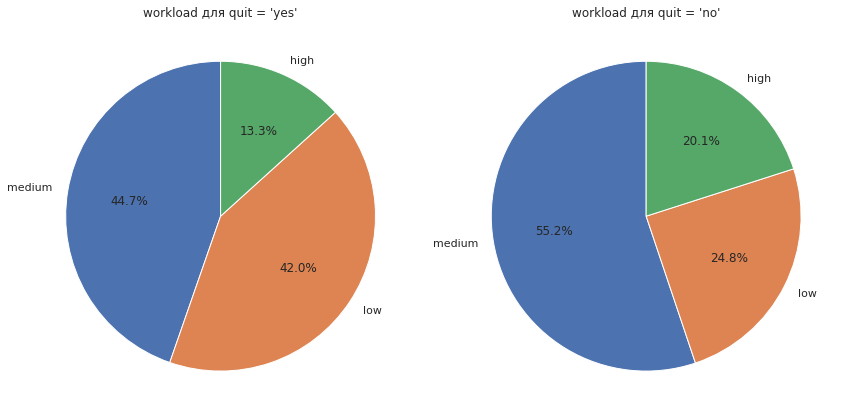

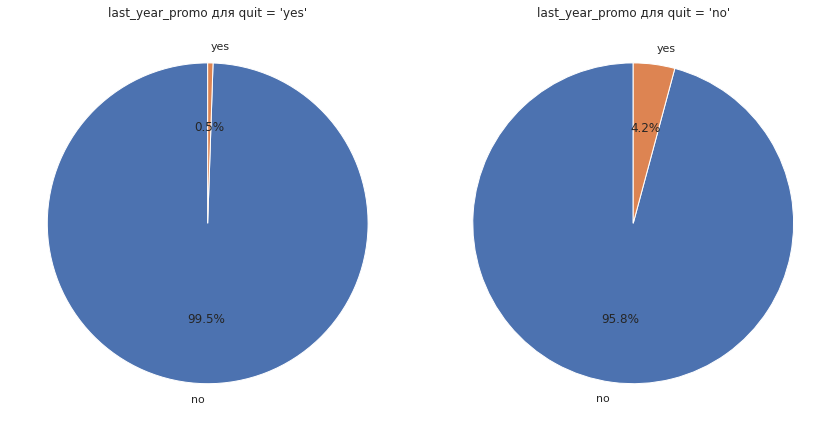

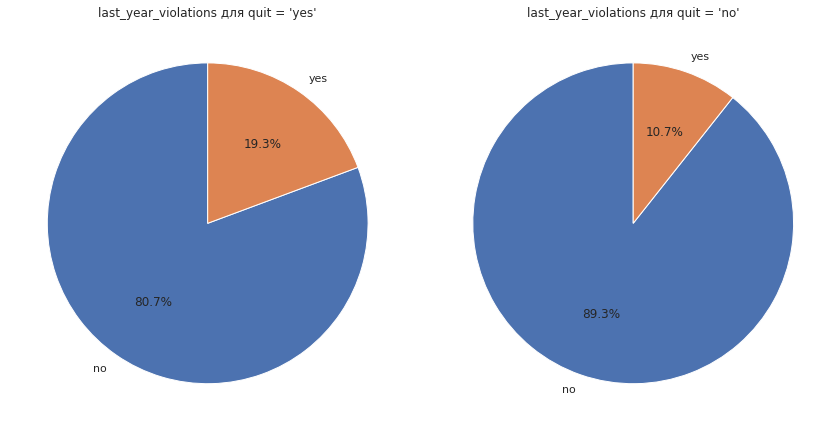

In [56]:
plot_categorical_features_pie_quit(test_target_quit_merged)

### Портрет "уволившегося сотрудника"

In [57]:
# Отберем уволившихся сотрудников
resigned = test_target_quit_merged.query('quit == "yes"')
not_resigned = test_target_quit_merged.query('quit == "no"')

resigned.head()

,id,quit,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary,job_satisfaction_rate
0,999029,yes,technology,junior,medium,1,no,no,3,31200,0.35
4,416898,yes,purchasing,junior,low,1,no,no,4,12000,0.57
16,709750,yes,hr,middle,low,3,no,no,1,19200,0.17
20,364247,yes,sales,junior,medium,1,no,no,3,21600,0.18
22,262781,yes,technology,junior,medium,1,no,no,1,25200,0.21


In [58]:
resigned['dept'].value_counts()

sales         227
technology    127
purchasing     78
marketing      67
hr             65
Name: dept, dtype: int64

In [59]:
resigned['level'].value_counts()

junior    489
middle     62
senior     13
Name: level, dtype: int64

In [60]:
resigned['workload'].value_counts()

medium    252
low       237
high       75
Name: workload, dtype: int64

In [61]:
print('Среднее время работы уволившегося сотрудника в компании:', resigned['employment_years'].mean())

Среднее время работы уволившегося сотрудника в компании: 1.975177304964539


In [62]:
print('Средняя ЗП уволившихся сотрудников:', resigned['salary'].median())
print('Средняя ЗП работающих сотрудников:', not_resigned['salary'].median())
print('Средняя разница в зарплатах:', not_resigned['salary'].median() - resigned['salary'].median())

Средняя ЗП уволившихся сотрудников: 22800.0
Средняя ЗП работающих сотрудников: 33600.0
Средняя разница в зарплатах: 10800.0


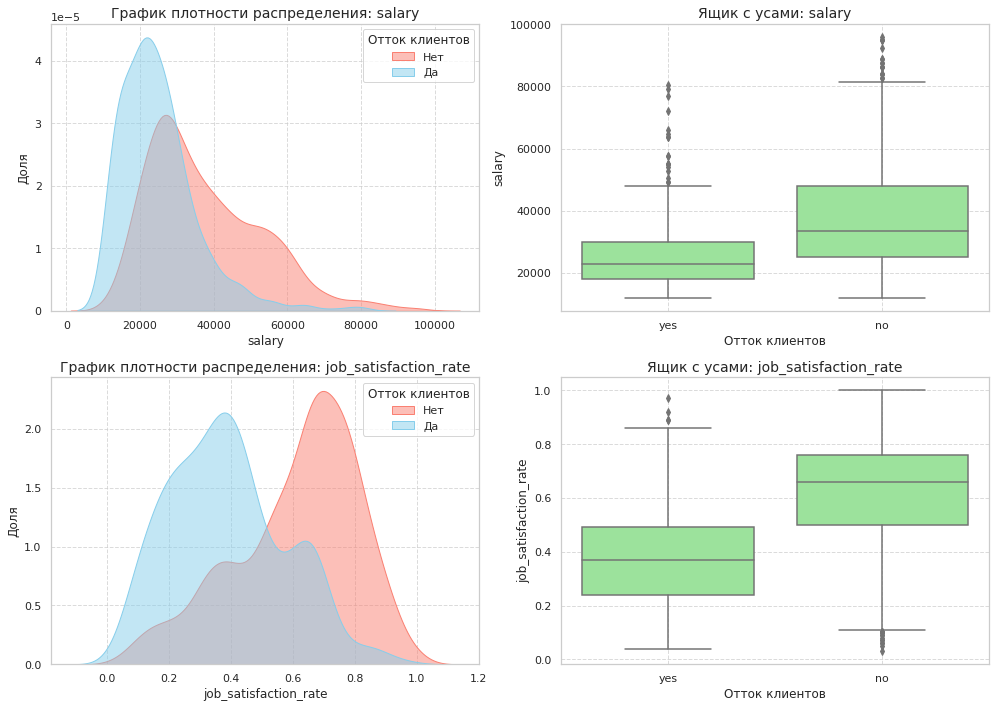

In [63]:
plot_distribution_kde(test_target_quit_merged, columns_to_analyze)

In [64]:
# Список характеристик для анализа
features = ['level', 'dept', 'workload', 'employment_years', 'last_year_promo', 'last_year_violations', 'supervisor_evaluation']

# Создаем словарь для хранения результатов
resigned_ratios = {}

for feature in features:
    # Получаем общее количество сотрудников по текущей характеристике
    total_counts = test_target_quit_merged[feature].value_counts()

    # Получаем количество уволившихся сотрудников по текущей характеристике
    resigned_counts = resigned[feature].value_counts()

    # Рассчитываем долю уволившихся
    resigned_ratio = resigned_counts / total_counts

    # Заменяем NaN на 0 для уровней, где не было уволившихся
    resigned_ratio = resigned_ratio.fillna(0)

    # Сохраняем результаты в словаре
    resigned_ratios[feature] = resigned_ratio

# Выводим результаты
for feature, ratio in resigned_ratios.items():
    print()
    print(f"Доля уволившихся сотрудников по '{feature}':")
    display(ratio)


Доля уволившихся сотрудников по 'level':


junior    0.501538
middle    0.072600
senior    0.076023
Name: level, dtype: float64


Доля уволившихся сотрудников по 'dept':


hr            0.286344
marketing     0.240143
purchasing    0.285714
sales         0.296345
technology    0.279121
Name: dept, dtype: float64


Доля уволившихся сотрудников по 'workload':


medium    0.241379
low       0.399663
high      0.206612
Name: workload, dtype: float64


Доля уволившихся сотрудников по 'employment_years':


1     0.557471
2     0.387701
3     0.346154
4     0.074866
5     0.039106
6     0.021739
7     0.074713
8     0.021978
9     0.090909
10    0.057143
Name: employment_years, dtype: float64


Доля уволившихся сотрудников по 'last_year_promo':


no     0.289623
yes    0.047619
Name: last_year_promo, dtype: float64


Доля уволившихся сотрудников по 'last_year_violations':


no     0.261795
yes    0.416031
Name: last_year_violations, dtype: float64


Доля уволившихся сотрудников по 'supervisor_evaluation':


1    0.431818
2    0.454082
3    0.478261
4    0.157526
5    0.095070
Name: supervisor_evaluation, dtype: float64

---
**Портрет уволившегося сотрудника:**
- Наиболее вероятно, что уволившийся сотрудник работает в отделе продаж (29.63%) или покупок (28.57%)
- Имеет низшую должность (junior)
- Имеет низкую загруженность
- Наиболее вероятно, что уволившийся сотрудник проработал 1 год (55.75%) или 2 года (38.77%)
- Уволившийся сотрудник, скорее всего, не получил повышение в прошлом году (28.96%)
- Уволившийся сотрудник, скорее всего, имел нарушения в прошлом году (41.60%)
- Вероятно, уволившийся сотрудник получил низкую оценку от своего руководителя — около 1-3 (всего 43.18% для оценки 1 и 45.41% для оценки 2, 0.47 для оценки 3)
- В среднем зарабатывает *22 800* (что на 10 800 меньше среднего уровня ЗП остальных сотрудников)
- Доля ушедших сотрудников - `28.2%` 

---

### Корреляционный анализ

In [65]:
# Удаление столбца 'id' и установка его в качестве индекса
test_target_quit_merged.set_index('id', inplace=True)
resigned.set_index('id', inplace=True)
not_resigned.set_index('id', inplace=True)

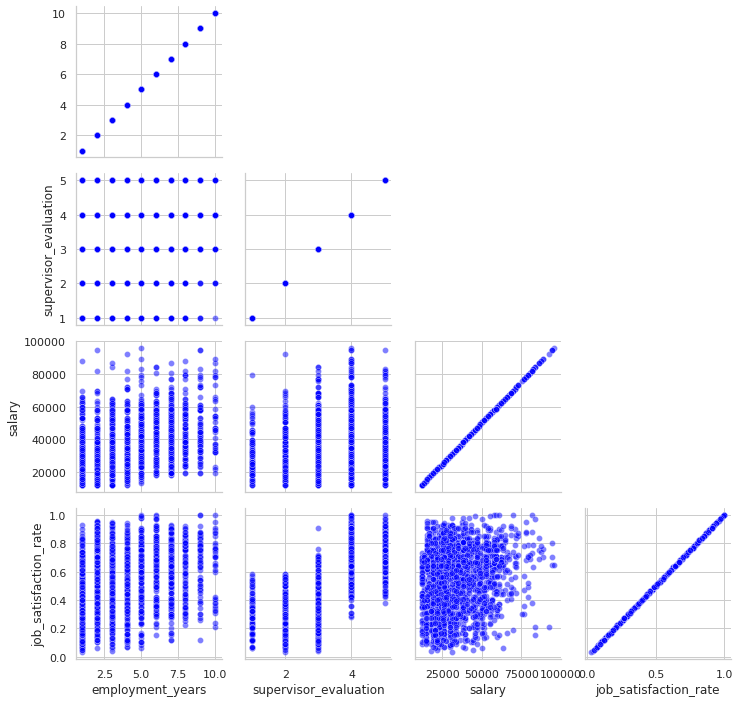

In [66]:
g = sns.PairGrid(test_target_quit_merged, diag_sharey=False, corner=True)
g.map(sns.scatterplot, alpha=0.5, color='blue')
g.add_legend()
plt.show()

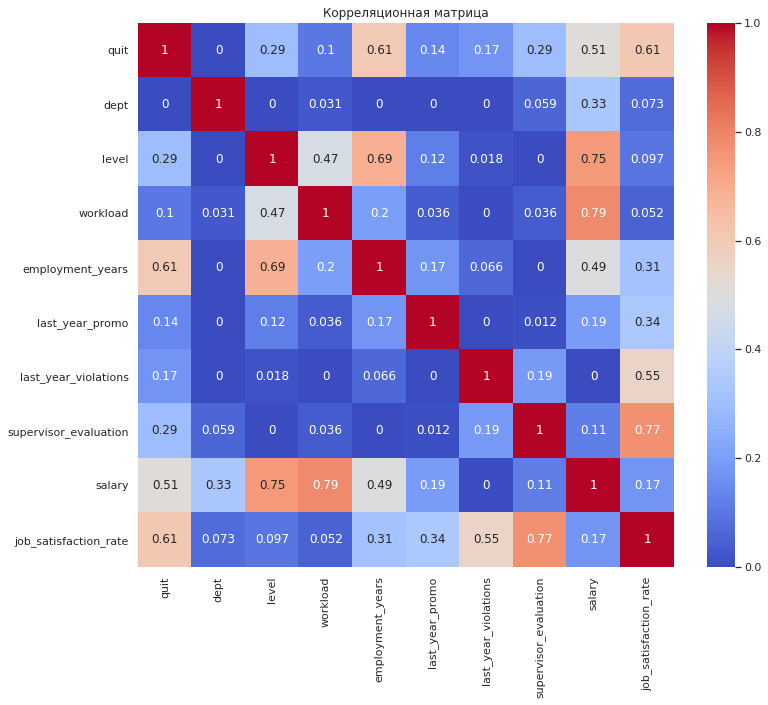

In [67]:
columns_to_analyze = [
    'salary', 
    'job_satisfaction_rate'
    
]
correlation_matrix = test_target_quit_merged.phik_matrix(interval_cols=columns_to_analyze)
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Корреляционная матрица')
plt.show()

/opt/conda/lib/python3.9/site-packages/phik/data_quality.py:82: UserWarning:

Not enough unique value for variable quit for analysis 1. Dropping this column



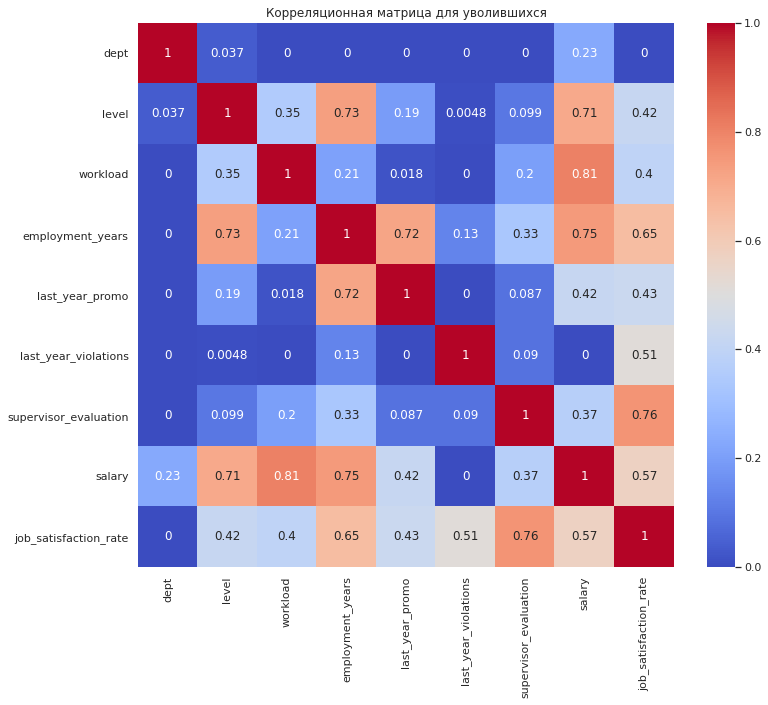

In [68]:
correlation_matrix = resigned.phik_matrix(interval_cols=columns_to_analyze)
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Корреляционная матрица для уволившихся')
plt.show()

/opt/conda/lib/python3.9/site-packages/phik/data_quality.py:82: UserWarning:

Not enough unique value for variable quit for analysis 1. Dropping this column



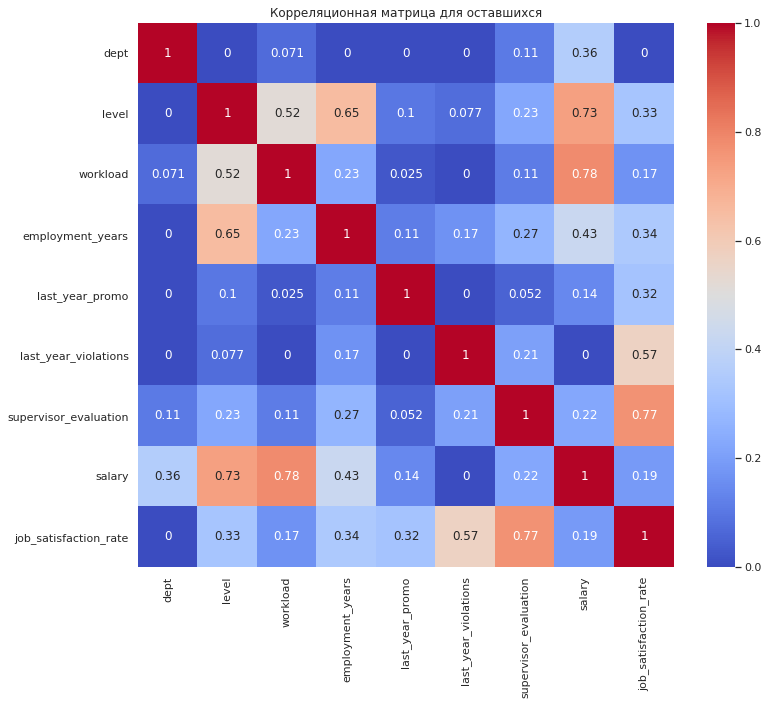

In [69]:
correlation_matrix = not_resigned.phik_matrix(interval_cols=columns_to_analyze)
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Корреляционная матрица для оставшихся')
plt.show()

**Общая корреляционная матрица:**

- Сильная положительная корреляция между quit (увольнение) и employment_years (стаж работы), job_satisfaction_rate (уровень удовлетворенности работой). Это говорит о том, что сотрудники с большим стажем работы и более низким уровнем удовлетворенности склонны увольняться.

- Средняя положительная корреляция между quit и salary (зарплата). Чем выше зарплата, тем меньше вероятность увольнения.

- Слабая положительная корреляция между quit и level (уровень должности).

- Слабая положительная корреляция между quit и last_year_violations (количество нарушений в прошлом году).

- Слабая положительная корреляция между quit и supervisor_evaluation (оценка руководителя).

- Практически отсутствует корреляция между quit и dept (отдел), workload (нагрузка).

**Корреляционная матрица для уволившихся:**

- Сильная положительная корреляция между employment_years и level, salary. Это говорит о том, что уволившиеся сотрудники, как правило, имели более высокий уровень должности и зарплаты, чем остальные.

- Средняя положительная корреляция между employment_years и job_satisfaction_rate. Чем выше стаж работы, тем ниже уровень удовлетворенности у уволившихся сотрудников.

- Средняя положительная корреляция между job_satisfaction_rate и supervisor_evaluation, salary. Это говорит о том, что уволившиеся сотрудники, как правило, были недовольны оценкой руководителя и уровнем заработной платы.

- Слабая положительная корреляция между employment_years и last_year_promo (количество повышений в прошлом году).

- Слабая положительная корреляция между job_satisfaction_rate и last_year_violations.

- Практически отсутствует корреляция между workload и salary.

**Корреляционная матрица для оставшихся:**

- Сильная положительная корреляция между level и salary, employment_years.

- Средняя положительная корреляция между level и workload, job_satisfaction_rate.

- Слабая положительная корреляция между job_satisfaction_rate и supervisor_evaluation, last_year_violations.

- Практически отсутствует корреляция между dept и job_satisfaction_rate, last_year_violations.

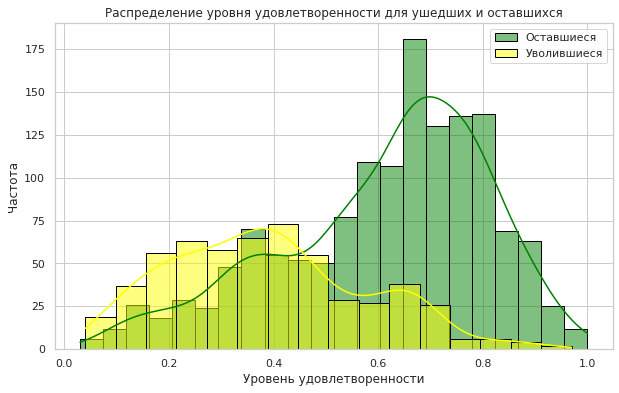

In [70]:
plt.figure(figsize=(10, 6))
sns.histplot(not_resigned['job_satisfaction_rate'], label='Оставшиеся', kde=True, color='green', edgecolor='black')
sns.histplot(resigned['job_satisfaction_rate'], label='Уволившиеся', kde=True, color='yellow', edgecolor='black')
plt.title('Распределение уровня удовлетворенности для ушедших и оставшихся')
plt.xlabel('Уровень удовлетворенности')
plt.ylabel('Частота')
plt.legend()
plt.show()

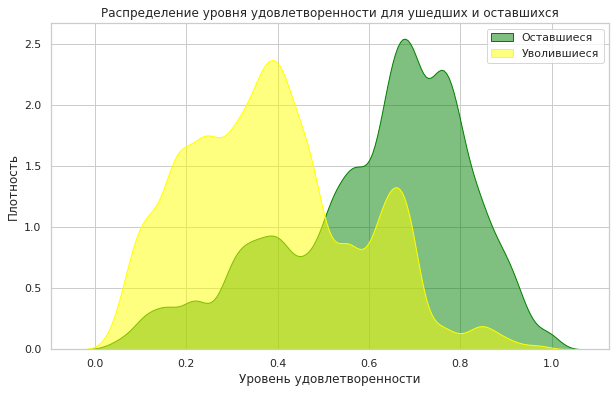

In [71]:
plt.figure(figsize=(10, 6))

# KDE для оставшихся
sns.kdeplot(not_resigned['job_satisfaction_rate'], label='Оставшиеся', color='green', fill=True, alpha=0.5, bw_adjust=0.5)

# KDE для уволившихся
sns.kdeplot(resigned['job_satisfaction_rate'], label='Уволившиеся', color='yellow', fill=True, alpha=0.5, bw_adjust=0.5)

plt.title('Распределение уровня удовлетворенности для ушедших и оставшихся')
plt.xlabel('Уровень удовлетворенности')
plt.ylabel('Плотность')
plt.legend()
plt.show()


* Для уволившихся сотрудников:

Распределение уровня удовлетворенности смещено влево, что говорит о том, что уволившиеся сотрудники, в среднем, имели более низкий уровень удовлетворенности, чем оставшиеся.

* Для оставшихся сотрудников: 

Распределение уровня удовлетворенности смещено вправо, что говорит о том, что оставшиеся сотрудники, в среднем, имели более высокий уровень удовлетворенности, чем уволившиеся.

**Постановка задачи:**

Проверить гипотезу о том, что уровень удовлетворённости сотрудника работой влияет на то, уволится ли сотрудник.

**Метод:**

Для проверки гипотезы воспользуемся t-тестом для независимых выборок.

**Гипотезы:**

* Нулевая гипотеза (H0): Нет значимой разницы в уровне удовлетворенности между уволенными и оставшимися сотрудниками.
* Альтернативная гипотеза (H1): Существует значимая разница в уровне удовлетворенности между уволенными и оставшимися сотрудниками.

In [72]:
# Вычисление t-статистики
t_stat, p_value = stats.ttest_ind(resigned['job_satisfaction_rate'], not_resigned['job_satisfaction_rate'])

# Вывод результатов
print(f"T-статистика: {t_stat}")
print(f"P-значение: {p_value}")

# Принятие решения
a = 0.05
if p_value < a:
    print("Отвергаем нулевую гипотезу. Уровень удовлетворенности влияет на увольнение.")
else:
    print("Не отвергаем нулевую гипотезу. Нет доказательств, что уровень удовлетворенности влияет на увольнение.") 

T-статистика: -23.074784903634527
P-значение: 1.2311220665173681e-104
Отвергаем нулевую гипотезу. Уровень удовлетворенности влияет на увольнение.


**Проведенный анализ позволяет сделать вывод, что уровень удовлетворенности работой является значимым фактором, влияющим на увольнение.**

## Подготовка данных для задачи №1

### Разделение данных на выборки

In [73]:
display(train_job.shape)
display(train_job.head(3))

(4000, 10)

,id,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary,job_satisfaction_rate
0,155278,sales,junior,medium,2,no,no,1,24000,0.58
1,653870,hr,junior,high,2,no,no,5,38400,0.76
2,184592,sales,junior,low,1,no,no,2,12000,0.11


In [74]:
display(test_features.shape)
display(test_features.head(3))

(2000, 9)

,id,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary
0,485046,marketing,junior,medium,2,no,no,5,28800
1,686555,hr,junior,medium,1,no,no,4,30000
2,467458,sales,middle,low,5,no,no,4,19200


In [75]:
display(test_target_job.shape)
display(test_target_job.head(3))

(2000, 2)

,id,job_satisfaction_rate
0,130604,0.74
1,825977,0.75
2,418490,0.60


In [76]:
train_job_no_id = train_job.drop(['id'], axis=1)
print('Количество явных дубликатов:',train_job_no_id.duplicated().sum())
train_job_no_id.head()

Количество явных дубликатов: 248


,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary,job_satisfaction_rate
0,sales,junior,medium,2,no,no,1,24000,0.58
1,hr,junior,high,2,no,no,5,38400,0.76
2,sales,junior,low,1,no,no,2,12000,0.11
3,technology,junior,low,4,no,no,2,18000,0.37
4,hr,junior,medium,1,no,no,3,22800,0.20


Удалим данные дубликаты.

In [77]:
train_job_clear = train_job_no_id.drop_duplicates().reset_index(drop=True)
print('Количество явных дубликатов:',train_job_clear.duplicated().sum())

Количество явных дубликатов: 0


In [78]:
# загружаем данные
full_job = train_job_clear.copy()

X_train = full_job.drop(['job_satisfaction_rate'], axis=1)
y_train = full_job['job_satisfaction_rate']
test_job = test_features.merge(test_target_job, on='id')

X_test = test_job.drop(['job_satisfaction_rate','id'], axis=1)
y_test = test_job['job_satisfaction_rate']

print(X_train.shape, X_test.shape)
y_train.shape, y_test.shape

(3752, 8) (2000, 8)


((3752,), (2000,))

### Создание пайплайна

In [79]:
# создаём списки с названиями признаков
ord_columns = ['level', 'workload']
ohe_columns = ['last_year_violations', 'last_year_promo', 'dept']
num_columns = ['employment_years', 'supervisor_evaluation', 'salary'] 

In [80]:
# Создаем конвейер для обработки данных с помощью One-Hot Encoding
ohe_pipe = Pipeline(
    [
        (
            'simpleImputer_ohe',  # Название первого шага в конвейере
            # Простой импьютер для заполнения пропущенных значений
            SimpleImputer(missing_values=np.nan, strategy='most_frequent')  
            # В качестве стратегии заполнения выбрано наиболее часто встречающееся значение в столбце
        ),
        (
            'ohe',  # Название второго шага в конвейере
            OneHotEncoder(drop='first', sparse_output=False, handle_unknown='ignore')  # Применяем one-hot-encoding
            # drop='first' позволяет избежать избыточности данных путем удаления первого уровня каждой категории
            # sparse_output=False гарантирует, что вывод будет в виде плотного массива numpy, а не разреженной матрицы
            # handle_unknown='ignore' указывает, что в случае новых, ранее не виданных категорий они будут игнорироваться
        )
    ]
)
ohe_pipe

Pipeline(steps=[('simpleImputer_ohe', SimpleImputer(strategy='most_frequent')),
                ('ohe',
                 OneHotEncoder(drop='first', handle_unknown='ignore',
                               sparse_output=False))])

In [81]:
# Определение конвейера
ord_pipe = Pipeline([
    # Замена пропущенных значений на наиболее часто встречающееся значение
    (
        'simpleImputer_before_ord',  # Название шага
        # Применяем SimpleImputer для замены пропущенных значений
        SimpleImputer(missing_values=np.nan, strategy='most_frequent')  
    ),
    # Кодирование категориальных признаков порядковыми значениями
    (
        'ord',  # Название шага
        OrdinalEncoder(  # Применяем OrdinalEncoder для кодирования категориальных признаков
            categories=[['junior', 'middle', 'senior'], ['low', 'medium', 'high']],  # Указываем категории для кодирования
            handle_unknown='use_encoded_value', unknown_value=np.nan  # Обрабатываем неизвестные значения
        )
    ),
    # Замена пропущенных значений на наиболее часто встречающееся значение
    (
        'simpleImputer_after_ord',  # Название шага
        # Применяем SimpleImputer для замены пропущенных значений
        SimpleImputer(missing_values=np.nan, strategy='most_frequent') 
    )
])
ord_pipe

Pipeline(steps=[('simpleImputer_before_ord',
                 SimpleImputer(strategy='most_frequent')),
                ('ord',
                 OrdinalEncoder(categories=[['junior', 'middle', 'senior'],
                                            ['low', 'medium', 'high']],
                                handle_unknown='use_encoded_value',
                                unknown_value=nan)),
                ('simpleImputer_after_ord',
                 SimpleImputer(strategy='most_frequent'))])

In [82]:
# Объединим кодирование и масштабирование в один пайплайн с подготовкой данных
data_preprocessor = ColumnTransformer(
    [
        # Шаг 1: Применяем one-hot encoding для выбранных категориальных столбцов
        ('ohe', ohe_pipe, ohe_columns),  # Применяем ohe_pipe к ohe_columns
        # Шаг 2: Применяем порядковое кодирование для выбранных категориальных столбцов
        ('ord', ord_pipe, ord_columns),  # Применяем ord_pipe к ord_columns
        # Шаг 3: Применяем MinMaxScaler для числовых столбцов
        ('num', MinMaxScaler(), num_columns)
    ],
    remainder='passthrough'  # Пропускаем остальные столбцы без изменений
)
data_preprocessor

ColumnTransformer(remainder='passthrough',
                  transformers=[('ohe',
                                 Pipeline(steps=[('simpleImputer_ohe',
                                                  SimpleImputer(strategy='most_frequent')),
                                                 ('ohe',
                                                  OneHotEncoder(drop='first',
                                                                handle_unknown='ignore',
                                                                sparse_output=False))]),
                                 ['last_year_violations', 'last_year_promo',
                                  'dept']),
                                ('ord',
                                 Pipeline(steps=[('simpleImputer_before_ord',
                                                  SimpleImputer(strategy='most_frequent')),
                                                 ('ord',
                                                  OrdinalEncoder(categories=[['junior',
                                                                              'middle',
                                                                              'senior'],
                                                                             ['low',
                                                                              'medium',
                                                                              'high']],
                                                                 handle_unknown='use_encoded_value',
                                                                 unknown_value=nan)),
                                                 ('simpleImputer_after_ord',
                                                  SimpleImputer(strategy='most_frequent'))]),
                                 ['level', 'workload']),
                                ('num', MinMaxScaler(),
                                 ['employment_years', 'supervisor_evaluation',
                                  'salary'])])

In [83]:
# создаём итоговый пайплайн: подготовка данных и модель
pipe_final = Pipeline([
    # Шаг 1: Подготовка данных с помощью data_preprocessor
    ('preprocessor', data_preprocessor),
    # Шаг 2: Обучение модели LinearRegression
    ('models', LinearRegression(n_jobs=-1)) 
])
pipe_final

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  ['last_year_violations',
                                                   'last_year_promo', 'dept']),
                                                 ('ord',
                                                  Pipeline(steps=[('simpleImputer_befor...
                                                                  ('ord',
                                                                   OrdinalEncoder(categories=[['junior',
                                                                                               'middle',
                                                                                               'senior'],
                                                                                              ['low',
                                                                                               'medium',
                                                                                               'high']],
                                                                                  handle_unknown='use_encoded_value',
                                                                                  unknown_value=nan)),
                                                                  ('simpleImputer_after_ord',
                                                                   SimpleImputer(strategy='most_frequent'))]),
                                                  ['level', 'workload']),
                                                 ('num', MinMaxScaler(),
                                                  ['employment_years',
                                                   'supervisor_evaluation',
                                                   'salary'])])),
                ('models', LinearRegression(n_jobs=-1))])

In [84]:
def pipe_line(ohe_columns, ord_columns, num_columns):
    """
    Создает пайплайн для предобработки данных и обучения модели линейной регрессии.
    """

    # Пайплайн для one-hot encoding
    ohe_pipe = Pipeline([
        ('simpleImputer_ohe', SimpleImputer(missing_values=np.nan, strategy='most_frequent')),
        ('ohe', OneHotEncoder(drop='first', sparse_output=False, handle_unknown='ignore'))
    ])

    # Пайплайн для порядкового кодирования
    ord_pipe = Pipeline([
        ('simpleImputer_before_ord', SimpleImputer(missing_values=np.nan, strategy='most_frequent')),
        ('ord', OrdinalEncoder(categories=[['junior', 'middle', 'senior'], ['low', 'medium', 'high']],
                               handle_unknown='use_encoded_value', unknown_value=np.nan)),
        ('simpleImputer_after_ord', SimpleImputer(missing_values=np.nan, strategy='most_frequent'))
    ])

    # Преобразователь столбцов
    data_preprocessor = ColumnTransformer([
        ('ohe', ohe_pipe, ohe_columns),
        ('ord', ord_pipe, ord_columns),
        ('num', MinMaxScaler(), num_columns)
    ], remainder='passthrough')

    # Итоговый пайплайн
    pipe_final = Pipeline([
        ('preprocessor', data_preprocessor),
        ('models', LinearRegression(n_jobs=-1))
    ])

    return pipe_final


In [85]:
my_pipeline = pipe_line(ohe_columns, ord_columns, num_columns)

В разделе 4 выполнены следующие ключевые действия:

**Удалены ненужные признаки**
- Был удалён идентификатор `id` из набора данных, поскольку он не несёт информации, полезной для моделирования.
- Была проведена проверка на наличие явных дубликатов, и было обнаружено 248 таких записей. Дубликаты были удалены для предотвращения искажения модели.

**Данные были разделены на обучающую и тестовую выборки.**
- Обучающая выборка включает 3752 наблюдения, а тестовая — 2000.

**Создан пайплайн**
- Были созданы списки признаков для разных типов обработки данных.
- Для категориальных переменных, требующих OHE-кодирования и Ordinal-кодирования, были созданы отдельные пайплайны с использованием `KNNImputer` для заполнения пропущенных значений и соответствующих кодировщиков (`OneHotEncoder` и `OrdinalEncoder`).
- Для числовых признаков было применено масштабирование с помощью `MinMaxScaler`.
- Все преобразования были объединены в единый пайплайн с помощью `ColumnTransformer`, который позволяет применять различные трансформации к разным подмножествам признаков.
- Итоговый пайплайн под названием `pipe_final` включает в себя шаги по подготовке данных и инициализацию модели `LinearRegression`.

## Задача №1 Предсказание удовлетворенности работой

Выберим лучшую модель на основе метрики — SMAPE (англ. symmetric mean absolute percentage error, «симметричное среднее абсолютное процентное отклонение»).  

Метрика SMAPE вычисляется так:

$$
SMAPE = \frac{100}{n} \sum_{i=1}^{n} \frac{|y_i - \hat{y}_i|}{(|y_i| + |\hat{y}_i|)/2} \
$$

где:

- $y_i$ - фактическое значение целевого признака для объекта с порядковым номером $i$ в выборке;
- $\hat{y}_i$ - предсказанное значение целевого признака для объекта с порядковым номером $i$ в выборке;
- $n$ - количество объектов в выборке;
- $\sum_{i=1}^{n}$ - сумма значений, полученная в результате операций, которые следуют за этим знаком, для всех объектов с порядковым номером от $i$ до $n$ в выборке.


Создадим scorer для SMAPE

In [86]:
smape_scorer = make_scorer(smape, greater_is_better=False)

In [87]:
param_grid = [
    {
        'models': [LinearRegression()],
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough'],
    },
    {
        'models': [DecisionTreeRegressor(random_state=RANDOM_STATE)],
        'models__max_depth': range(1, 21),
        'models__min_samples_leaf': range(1, 6),
        'models__min_samples_split': range(2, 6),
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough'],
    },
    
    {
        'models': [KNeighborsRegressor(n_jobs=-1, weights='distance')],
        'models__n_neighbors': range(5, 20),
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough'],
    },
]

In [88]:
kf_cv = KFold(n_splits=5, shuffle=True, random_state=RANDOM_STATE)

grid_search = RandomizedSearchCV(
    pipe_final, 
    param_grid, 
    n_iter=100,
    cv=kf_cv,
    scoring=smape_scorer,
    n_jobs=-1,
    random_state=RANDOM_STATE
)
grid_search.fit(X_train, y_train)


RandomizedSearchCV(cv=KFold(n_splits=5, random_state=42, shuffle=True),
                   estimator=Pipeline(steps=[('preprocessor',
                                              ColumnTransformer(remainder='passthrough',
                                                                transformers=[('ohe',
                                                                               Pipeline(steps=[('simpleImputer_ohe',
                                                                                                SimpleImputer(strategy='most_frequent')),
                                                                                               ('ohe',
                                                                                                OneHotEncoder(drop='first',
                                                                                                              handle_unknown='ignore',
                                                                                                              sparse_output=False))]),
                                                                               ['last_year_viol...
                                         'models__min_samples_split': range(2, 6),
                                         'preprocessor__num': [StandardScaler(),
                                                               MinMaxScaler(),
                                                               'passthrough']},
                                        {'models': [KNeighborsRegressor(n_jobs=-1,
                                                                        weights='distance')],
                                         'models__n_neighbors': range(5, 20),
                                         'preprocessor__num': [StandardScaler(),
                                                               MinMaxScaler(),
                                                               'passthrough']}],
                   random_state=42,
                   scoring=make_scorer(smape, greater_is_better=False, response_method='predict'))

In [89]:
print('Лучшая модель и её параметры:\n\n', grid_search.best_estimator_)

print('Параметры лучшей модели:', grid_search.best_params_)

print('Метрика лучшей модели на кросс-валидации на обучающих данных:', grid_search.best_score_*-1)


Лучшая модель и её параметры:

 Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  ['last_year_violations',
                                                   'last_year_promo', 'dept']),
                                                 ('ord',
                            

In [90]:
# Предсказываем значения на тестовой выборке и выводим метрику smape
y_test_pred_job = grid_search.best_estimator_.predict(X_test)
print(f'Метрика SMAPE на тестовой выборке: {smape(y_test, y_test_pred_job)}')

Метрика SMAPE на тестовой выборке: 13.467586541095505


Наша модель показала SMAPE 13.46 на тестовой выборке, что ниже целевого значения 15. Это значит, что мы успешно справились с задачей.

Давайте теперь посмотрим на результаты других моделей.

In [91]:
result_job = pd.DataFrame(grid_search.cv_results_).loc[:, ['params', 'mean_test_score', 'rank_test_score']]
result_job.mean_test_score = result_job.mean_test_score * -1
result_job = result_job.sort_values(by='rank_test_score')
# Конвертация значений в столбце params в строки
result_job['params'] = result_job['params'].astype(str)
result_job.head(10)

,params,mean_test_score,rank_test_score
17,"{'preprocessor__num': MinMaxScaler(), 'models_...",15.288240,1
87,"{'preprocessor__num': MinMaxScaler(), 'models_...",15.292148,2
50,"{'preprocessor__num': 'passthrough', 'models__...",15.292219,3
9,"{'preprocessor__num': 'passthrough', 'models__...",15.292219,3
63,"{'preprocessor__num': StandardScaler(), 'model...",15.293440,5
40,"{'preprocessor__num': StandardScaler(), 'model...",15.299402,6
77,"{'preprocessor__num': MinMaxScaler(), 'models_...",15.306582,7
54,"{'preprocessor__num': 'passthrough', 'models__...",15.311104,8
1,"{'preprocessor__num': StandardScaler(), 'model...",15.314932,9
68,"{'preprocessor__num': 'passthrough', 'models__...",15.370751,10


Для проверки модели на адекватность будем использовать классификатор `DummyRegressor`

In [92]:
# Создаем экземпляр DummyRegressor
dummy_model = DummyRegressor()

# Обучаем DummyRegressor на тренировочных данных
dummy_model.fit(X_train, y_train)

# Предсказываем значения с помощью DummyRegressor на тестовых данных
dummy_model_preds = dummy_model.predict(X_test)

print(f'Метрика SMAPE dummy: {smape(y_test, dummy_model_preds)}')
print(f'Метрика SMAPE на тестовой выборке: {smape(y_test, y_test_pred_job)}')

Метрика SMAPE dummy: 38.262831018170885
Метрика SMAPE на тестовой выборке: 13.467586541095505


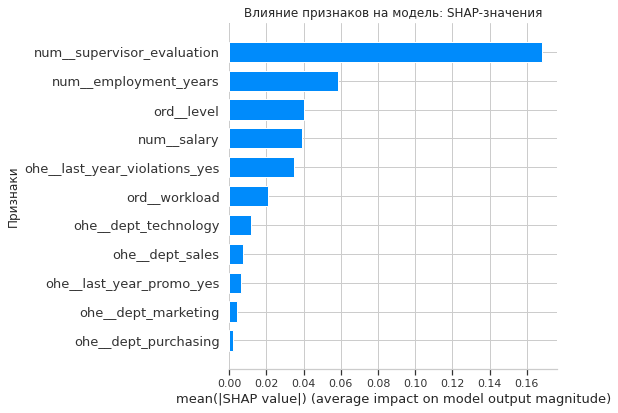

In [93]:
# Подготовим данные для SHAP-анализа
model = grid_search.best_estimator_['models']
preprocessor_pipe = grid_search.best_estimator_.named_steps['preprocessor']
X_train_scalled = preprocessor_pipe.fit_transform(X_train)
X_test_scalled = preprocessor_pipe.transform(X_test)
feature_names = grid_search.best_estimator_[:-1].get_feature_names_out()

# Создаем Explainer
explainer = shap.TreeExplainer(model)

# Получаем SHAP-значения для данных
shap_values = explainer.shap_values(X_test_scalled)


# Подписываем оси
# Добавляем заголовок и подписи осей
plt.title('Влияние признаков на модель: SHAP-значения')
plt.xlabel('SHAP значение')
plt.ylabel('Признаки')
shap.summary_plot(shap_values, X_test_scalled, feature_names=feature_names, plot_type="bar")
# Показываем график
plt.show()



### Результаты обучения №1

---
- Сильнее других на предсказания модели влияет признак `supervisor_evaluation`.  
- На втором месте - `employment_years`. 

**Лучшая модель для предсказания удовлетворенности работой - это модель DecisionTreeRegressor с параметрами:**

- max_depth: 20
- min_samples_leaf: 4
- min_samples_split: 3
- preprocessor__num: MinMaxScaler

**Эта модель показала SMAPE 13.46 на тестовой выборке, что ниже целевого значения 15. Это значит, что модель успешно справилась с задачей**

## Задача №2  Предсказание увольнения сотрудника

### Добавление нового входного признака

In [94]:
quit_X_train = train_quit.copy(deep=True)
# Создаем экземпляр LabelEncoder
label_encoder = LabelEncoder()

# Преобразуем категориальные значения в числовой формат
quit_X_train['quit'] = label_encoder.fit_transform(quit_X_train['quit'])

# Выводим связь между значениями и кодами
print("\nСвязь между значениями и кодами:")
for code, category in enumerate(label_encoder.classes_):
    print(f"Код {code}: Значение '{category}'")


Связь между значениями и кодами:
Код 0: Значение 'no'
Код 1: Значение 'yes'


In [95]:
quit_train_JSR = grid_search.best_estimator_.predict(quit_X_train)
quit_train_JSR

array([0.605     , 0.84636364, 0.3325    , ..., 0.54428571, 0.502     ,
       0.53      ])

In [96]:
quit_X_train_ml = quit_X_train.copy(deep=True)
quit_X_train_ml['job_satisfaction_rate'] = quit_train_JSR
display(quit_X_train_ml.head())
display(quit_X_train_ml.shape)


,id,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary,quit,job_satisfaction_rate
0,723290,sales,middle,high,2,no,no,4,54000,0,0.605000
1,814010,sales,junior,medium,2,no,no,4,27600,0,0.846364
2,155091,purchasing,middle,medium,5,no,no,1,37200,0,0.332500
3,257132,sales,junior,medium,2,no,yes,3,24000,1,0.350000
4,910140,marketing,junior,medium,2,no,no,5,25200,0,0.791667


(4000, 11)

In [97]:
quit_X_train_ml = quit_X_train_ml.drop(['id'], axis=1)
print('Количество явных дубликатов:',quit_X_train_ml.duplicated().sum())

Количество явных дубликатов: 1413


In [98]:
quit_X_train_ml = quit_X_train_ml.drop_duplicates().reset_index(drop=True)
print('Количество явных дубликатов:',quit_X_train_ml.duplicated().sum())

Количество явных дубликатов: 0


In [99]:
# Выделяем таргет в тренировочной выборке
quit_y_train_ml = quit_X_train_ml['quit']
display(quit_y_train_ml.head(5))
display(quit_y_train_ml.shape)

0    0
1    0
2    0
3    1
4    0
Name: quit, dtype: int64

(2587,)

In [100]:
# Убираем таргет из трейна и индексируем выборки
quit_X_train_ml = quit_X_train_ml.drop('quit', axis=1)
quit_X_train_ml.head(5)

,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary,job_satisfaction_rate
0,sales,middle,high,2,no,no,4,54000,0.605000
1,sales,junior,medium,2,no,no,4,27600,0.846364
2,purchasing,middle,medium,5,no,no,1,37200,0.332500
3,sales,junior,medium,2,no,yes,3,24000,0.350000
4,marketing,junior,medium,2,no,no,5,25200,0.791667


In [101]:
quit_X_test_ml = test_features.copy()
quit_X_test_ml['job_satisfaction_rate'] = grid_search.best_estimator_.predict(X_test)
quit_X_test_ml.set_index('id', inplace=True)
display(quit_X_test_ml.head())
display(quit_X_test_ml.shape)

,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary,job_satisfaction_rate
id,,,,,,,,,
485046,marketing,junior,medium,2,no,no,5,28800,0.845714
686555,hr,junior,medium,1,no,no,4,30000,0.678750
467458,sales,middle,low,5,no,no,4,19200,0.697778
418655,sales,middle,low,6,no,no,4,19200,0.697778
789145,hr,middle,medium,5,no,no,5,40800,0.812500


(2000, 9)

In [102]:
quit_y_test_ml = test_target_quit.copy()
quit_y_test_ml.set_index('id', inplace=True)
quit_y_test_ml['quit'] = label_encoder.fit_transform(quit_y_test_ml['quit'])
display(quit_y_test_ml.head(5))
display(quit_y_test_ml.shape)



,quit
id,
999029,1
372846,0
726767,0
490105,0
416898,1


(2000, 1)

In [103]:
# Добавляем новый признак в preprocessor
num_columns.append('job_satisfaction_rate')

pipe_final_2 = pipe_line(ohe_columns, ord_columns, num_columns)

In [104]:
param_grid = [
    # словарь для модели KNeighborsClassifier() 
    {
        'models': [KNeighborsClassifier()],
        'models__n_neighbors': range(2, 10),
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), RobustScaler(), 'passthrough']   
    },
    
    # словарь для модели DecisionTreeClassifier()
    {
        'models': [DecisionTreeClassifier(random_state=RANDOM_STATE)],
        'models__max_depth': range(2, 10),
        'models__max_features': range(2, 10),
        'models__class_weight': [None, 'balanced'],
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), RobustScaler(), 'passthrough']  
    },
    
    # словарь для модели LogisticRegression()
    {
        'models': [LogisticRegression(
            random_state=RANDOM_STATE, 
            solver='liblinear', 
            penalty='l1'
        )],
        'models__C': range(1, 10),
        'models__class_weight': [None, 'balanced'],
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), RobustScaler(), 'passthrough']  
    }
]

param_grid

[{'models': [KNeighborsClassifier()],
  'models__n_neighbors': range(2, 10),
  'preprocessor__num': [StandardScaler(),
   MinMaxScaler(),
   RobustScaler(),
   'passthrough']},
 {'models': [DecisionTreeClassifier(random_state=42)],
  'models__max_depth': range(2, 10),
  'models__max_features': range(2, 10),
  'models__class_weight': [None, 'balanced'],
  'preprocessor__num': [StandardScaler(),
   MinMaxScaler(),
   RobustScaler(),
   'passthrough']},
 {'models': [LogisticRegression(penalty='l1', random_state=42, solver='liblinear')],
  'models__C': range(1, 10),
  'models__class_weight': [None, 'balanced'],
  'preprocessor__num': [StandardScaler(),
   MinMaxScaler(),
   RobustScaler(),
   'passthrough']}]

In [105]:
# Определяем стратегию кросс-валидации
stratified_cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=RANDOM_STATE)
grid_search_quit = GridSearchCV(
    pipe_final_2, 
    param_grid=param_grid, 
    cv=stratified_cv,
    scoring='roc_auc',
    n_jobs=-1
)
grid_search_quit.fit(quit_X_train_ml, quit_y_train_ml)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('ohe',
                                                                         Pipeline(steps=[('simpleImputer_ohe',
                                                                                          SimpleImputer(strategy='most_frequent')),
                                                                                         ('ohe',
                                                                                          OneHotEncoder(drop='first',
                                                                                                        handle_unknown='ignore',
                                                                                                        sparse_output=False))]),
                                                                         ['last_year_...
                          'models__max_features': range(2, 10),
                          'preprocessor__num': [StandardScaler(),
                                                MinMaxScaler(), RobustScaler(),
                                                'passthrough']},
                         {'models': [LogisticRegression(penalty='l1',
                                                        random_state=42,
                                                        solver='liblinear')],
                          'models__C': range(1, 10),
                          'models__class_weight': [None, 'balanced'],
                          'preprocessor__num': [StandardScaler(),
                                                MinMaxScaler(), RobustScaler(),
                                                'passthrough']}],
             scoring='roc_auc')

In [106]:
# Выведем результаты в виде датафрейм
pd.DataFrame(grid_search_quit.cv_results_)[
    ['std_test_score', 'rank_test_score', 'param_models', 'mean_test_score','params']
].sort_values('mean_test_score').head(10)

,std_test_score,rank_test_score,param_models,mean_test_score,params
35,0.015554,613,DecisionTreeClassifier(random_state=42),0.667595,{'models': DecisionTreeClassifier(random_state...
32,0.015554,613,DecisionTreeClassifier(random_state=42),0.667595,{'models': DecisionTreeClassifier(random_state...
33,0.015554,613,DecisionTreeClassifier(random_state=42),0.667595,{'models': DecisionTreeClassifier(random_state...
34,0.015554,613,DecisionTreeClassifier(random_state=42),0.667595,{'models': DecisionTreeClassifier(random_state...
291,0.018076,609,DecisionTreeClassifier(random_state=42),0.673606,{'models': DecisionTreeClassifier(random_state...
290,0.018076,609,DecisionTreeClassifier(random_state=42),0.673606,{'models': DecisionTreeClassifier(random_state...
288,0.018076,609,DecisionTreeClassifier(random_state=42),0.673606,{'models': DecisionTreeClassifier(random_state...
289,0.018076,609,DecisionTreeClassifier(random_state=42),0.673606,{'models': DecisionTreeClassifier(random_state...
64,0.014241,601,DecisionTreeClassifier(random_state=42),0.798243,{'models': DecisionTreeClassifier(random_state...
322,0.014241,601,DecisionTreeClassifier(random_state=42),0.798243,{'models': DecisionTreeClassifier(random_state...


In [107]:
print('Лучшая модель и её параметры:\n\n', grid_search_quit.best_estimator_)

print('Параметры лучшей модели:', grid_search_quit.best_params_)

print('Метрика лучшей модели по кросс-валидации на обучающих данных:', grid_search_quit.best_score_)
# Предсказываем значения на тестовой выборке и выводим метрику ROC-AUC
y_test_proba_quit= grid_search_quit.predict_proba(quit_X_train_ml)[:,1]
print(f'Метрика ROC-AUC на тестовой выборке: {roc_auc_score(quit_y_train_ml, y_test_proba_quit)}')

Лучшая модель и её параметры:

 Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  ['last_year_violations',
                                                   'last_year_promo', 'dept']),
                                                 ('ord',
                            

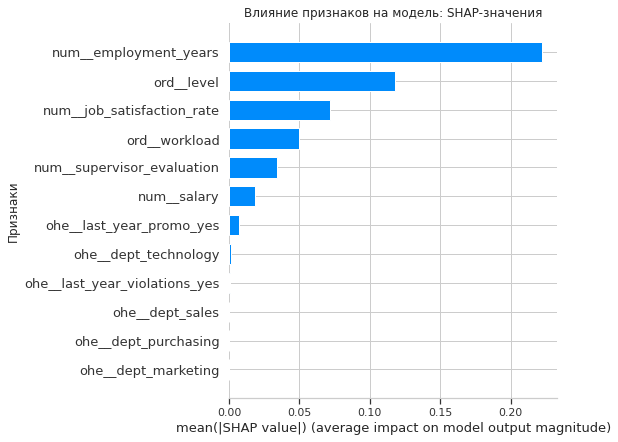

In [108]:
# Подготовим данные для SHAP-анализа
model = grid_search_quit.best_estimator_['models']
preprocessor_pipe = grid_search_quit.best_estimator_.named_steps['preprocessor']
X_train_scalled = preprocessor_pipe.fit_transform(quit_X_train_ml)
X_test_scalled = preprocessor_pipe.transform(quit_X_test_ml)
feature_names = grid_search_quit.best_estimator_[:-1].get_feature_names_out()

# Создаем Explainer
explainer = shap.TreeExplainer(model)

# Получаем SHAP-значения для данных
shap_values = explainer.shap_values(X_test_scalled)


# Подписываем оси
plt.title('Влияние признаков на модель: SHAP-значения')
plt.xlabel('SHAP значение')
plt.ylabel('Признаки')
shap.summary_plot(shap_values[:, :, 1], X_test_scalled, feature_names=feature_names, plot_type="bar")
# Показываем график
plt.show()


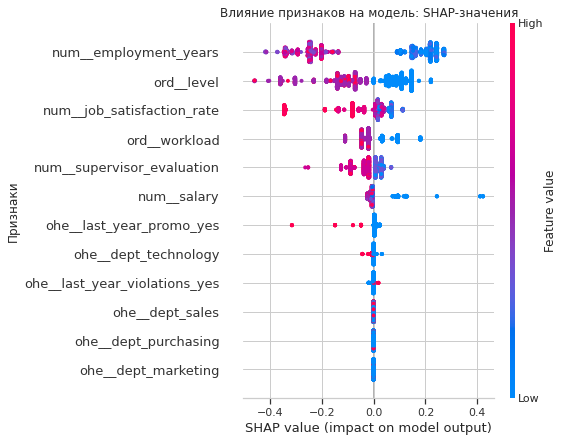

In [109]:
# Подготовим данные для SHAP-анализа
X_train_scalled_2 = preprocessor_pipe.fit_transform(quit_X_train_ml)
X_test_scalled_2 = preprocessor_pipe.transform(quit_X_test_ml)
feature_names = grid_search_quit.best_estimator_[:-1].get_feature_names_out()
# Создаем Explainer
explainer = shap.TreeExplainer(model)

# Получаем SHAP-значения для данных
shap_values = explainer.shap_values(X_test_scalled_2)
X_test_df = pd.DataFrame(X_test_scalled_2, columns=feature_names)
# Визуализиурем важность признаков
plt.title('Влияние признаков на модель: SHAP-значения')
plt.xlabel('SHAP значение')
plt.ylabel('Признаки')
plt.rcParams['figure.figsize'] = (30, 20) 
shap.summary_plot(shap_values[:, :, 1],  X_test_df, feature_names=preprocessor_pipe.get_feature_names_out())
plt.show()

Признак employment_years оказывает значительное влияние на решения модели. Значительный вес имеет признак level. Получается, что два этих показателя являются ключевыми при решении сотрудника "уволиться"

### Результаты обучения
**Общий вывод**
Проведенный анализ данных позволил создать две модели машинного обучения:

1. Модель для предсказания удовлетворенности работой
- Лучшая модель:

- Модель: DecisionTreeRegressor
- Параметры:
- max_depth: 20
- min_samples_leaf: 4
- min_samples_split: 3
- preprocessor__num: MinMaxScaler

**Метрика SMAPE на тестовой выборке: 13.46**
**Эта модель показала результаты ниже целевого значения 15, что свидетельствует о ее успешной работе.**

2. Модель для предсказания увольнения
- Лучшая модель:

- Модель: DecisionTreeClassifier
- Параметры:
- max_depth: 4
- max_features: 8
- class_weight: balanced
- preprocessor__num: StandardScaler

**Метрика ROC-AUC на тестовой выборке: 0.913**
**Эта модель также показала отличные результаты, превысив минимальный порог 0.91, что позволяет считать ее адекватной для задач классификации.**



## Общий вывод проекта
    В ходе работы над проектом были успешно решены две ключевые задачи: предсказание уровня удовлетворенности сотрудников и предсказание увольнения сотрудников. Были созданы и протестированы несколько моделей, из которых были выбраны две лучшие, успешно прошедшие порог оценки качества.

    1. Предсказание уровня удовлетворенности сотрудников
        Этапы работы:
- Загрузка и подготовка данных: Обнаружены и обработаны пропущенные значения.
- Предобработка данных: Исправлены ошибки, проведена замена пропущенных значений.
- Исследовательский анализ данных: Выявлены ключевые факторы, влияющие на удовлетворенность: оценки руководителей, опыт работы и наличие нарушений.
- Подготовка признаков: Создан полный пайплайн с предобработкой данных.
- Обучение моделей: Лучшая модель — DecisionTreeRegressor с SMAPE 13.46. Важнейшие признаки: оценка руководителя и опыт работы.

    2. Предсказание увольнения сотрудников
        
        Этапы работы:
        
- Загрузка и подготовка данных: Данные были проверены на полноту и корректность.
- Предобработка данных: Закодированы ответные переменные, исправлены ошибки.
- Исследовательский анализ данных: Определены ключевые факторы увольнения: опыт работы и уровень зарплаты.
- Добавление нового признака: Включен уровень удовлетворенности как новый входной признак.
- Обучение моделей: Лучшая модель — DecisionTreeRegressor с ROC-AUC 0.91. Важнейшие признаки: опыт работы и уровень должности.
    
    **Рекомендации для клиента**
* Оценка труда сотрудников: Важно учитывать, как сотрудники воспринимают оценки своей работы, поскольку это влияет на их удовлетворенность.
* Текучесть кадров:  Необходимо разработать дополнительные программы для сотрудников на ранних этапах работы, чтобы снизить текучесть.
* Отдел продаж: Следует обратить внимание на зарплаты и условия работы сотрудников отдела продаж для повышения удержания.
* Удовлетворенность работой: Максимизация удовлетворенности сотрудников должна стать приоритетом, чтобы снизить уровень увольнений. Рекомендуется внедрение системы регулярного мониторинга удовлетворенности сотрудников, а также разработка программ лояльности и мотивации для снижения текучести кадров. 